# Final Project fo Bioinformatics and Network Medicine
### Disease Name: Degenerative disease of nervous system, unspecified. Disease ID: C0524851.
### Contributors: Sarah De Divitiis, Damian Zeller, Sofia Noemi Crobeddu.

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from adjustText import adjust_text
from gseapy import get_library_name, enrichr
import re
import random

In [2]:
random.seed(42)
np.random.seed(42)

In [3]:
pd.set_option("display.max_columns", None)

##  1.	PPI and GDA data gathering and interactome reconstruction

### 1.1. Download PPIs from BioGRID latest release to build the human interactome
- ### use “organisms” tab3 file, unzip and get “Homo sapiens” only
- ### filter out all non-human interactions, i.e., both “organism A” and “B” fields must be = 9606 (Homo sapiens)
- ### keep only “physical” interactions” (“Experimental System Type” = physical)
- ### purge out redundant and self loops
- ### isolate the largest connected component (interactome LCC)

First, we import the data of the PPI file and have a quick look at it.

In [4]:
path = "BIOGRID-ORGANISM-Homo_sapiens-4.4.240.tab3.txt"
data = pd.read_csv(path, sep = '\t', low_memory=False)

In [5]:
#Take a look
data

,#BioGRID Interaction ID,Entrez Gene Interactor A,Entrez Gene Interactor B,BioGRID ID Interactor A,BioGRID ID Interactor B,Systematic Name Interactor A,Systematic Name Interactor B,Official Symbol Interactor A,Official Symbol Interactor B,Synonyms Interactor A,Synonyms Interactor B,Experimental System,Experimental System Type,Author,Publication Source,Organism ID Interactor A,Organism ID Interactor B,Throughput,Score,Modification,Qualifications,Tags,Source Database,SWISS-PROT Accessions Interactor A,TREMBL Accessions Interactor A,REFSEQ Accessions Interactor A,SWISS-PROT Accessions Interactor B,TREMBL Accessions Interactor B,REFSEQ Accessions Interactor B,Ontology Term IDs,Ontology Term Names,Ontology Term Categories,Ontology Term Qualifier IDs,Ontology Term Qualifier Names,Ontology Term Types,Organism Name Interactor A,Organism Name Interactor B
0,103,6416,2318,112315,108607,-,-,MAP2K4,FLNC,JNKK|JNKK1|MAPKK4|MEK4|MKK4|PRKMK4|SAPKK-1|SAP...,ABP-280|ABP280A|ABPA|ABPL|FLN2|MFM5|MPD4,Two-hybrid,physical,Marti A (1997),PUBMED:9006895,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P45985,-,NP_003001|NP_001268364,Q14315,Q59H94,NP_001120959|NP_001449,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1,117,84665,88,124185,106603,-,-,MYPN,ACTN2,CMD1DD|CMH22|MYOP|RCM4,CMD1AA,Two-hybrid,physical,Bang ML (2001),PUBMED:11309420,9606,9606,Low Throughput,-,-,-,-,BIOGRID,Q86TC9,A0A087WX60,NP_001243197|NP_001243196|NP_115967,P35609,Q59FD9|F6THM6,NP_001094|NP_001265272|NP_001265273,-,-,-,-,-,-,Homo sapiens,Homo sapiens
2,183,90,2339,106605,108625,-,-,ACVR1,FNTA,ACTRI|ACVR1A|ACVRLK2|ALK2|FOP|SKR1|TSRI,FPTA|PGGT1A|PTAR2,Two-hybrid,physical,Wang T (1996),PUBMED:8599089,9606,9606,Low Throughput,-,-,-,-,BIOGRID,Q04771,D3DPA4,NP_001104537|NP_001096,P49354,-,NP_002018,-,-,-,-,-,-,Homo sapiens,Homo sapiens
3,278,2624,5371,108894,111384,-,-,GATA2,PML,DCML|IMD21|MONOMAC|NFE1B,MYL|PP8675|RNF71|TRIM19,Two-hybrid,physical,Tsuzuki S (2000),PUBMED:10938104,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P23769,-,NP_001139134|NP_116027|NP_001139133,P29590,-,NP_150250|NP_150253|NP_150252|NP_150247|NP_150...,-,-,-,-,-,-,Homo sapiens,Homo sapiens
4,418,6118,6774,112038,112651,RP4-547C9.3,-,RPA2,STAT3,REPA2|RP-A p32|RP-A p34|RPA32,ADMIO|APRF|HIES,Two-hybrid,physical,Kim J (2000),PUBMED:10875894,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P15927,B4DUL2,NP_001342057|NP_002937|NP_001284487|NP_0013420...,P40763,-,NP_644805|NP_003141|NP_001356447|NP_001356443|...,-,-,-,-,-,-,Homo sapiens,Homo sapiens
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1265581,3757042,5339,3855,111355,110053,-,-,PLEC,KRT7,EBS1|EBSO|HD1|LGMD2Q|PCN|PLEC1|PLEC1b|PLTN,CK7|K2C7|K7|SCL,Cross-Linking-MS (XL-MS),physical,Michael ARM (2024),PUBMED:39358380,9606,9606,High Throughput,-,-,High confidence protein interaction in A549 ce...,-,BIOGRID,Q15149,-,NP_000436|NP_958785|NP_958784|NP_958786|NP_958...,P08729,-,NP_005547,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1265582,3757043,1728,80070,108072,123100,-,-,NQO1,ADAMTS20,DHQU|DIA4|DTD|NMOR1|NMORI|QR1,ADAM-TS20|ADAMTS-20|GON-1,Cross-Linking-MS (XL-MS),physical,Michael ARM (2024),PUBMED:39358380,9606,9606,High Throughput,-,-,High confidence protein interaction in A549 ce...,-,BIOGRID,P15559,B4DLR8,NP_000894|NP_001273066|NP_001020604|NP_001020605,P59510,-,NP_079279,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1265583,3757044,3007,6132,109262,112052,-,-,HIST1H1D,RPL8,H1.3|H1D|H1F3|H1s-2,L8,Cross-Linking-MS (XL-MS),physical,Michael ARM (2024),PUBMED:39358380,9606,9606,High Throughput,-,-,High confidence protein interaction in A549 ce...,-,BIOGRID,P16402,-,NP_005311,P62917,-,NP_001304700|NP_001304711|NP_150644|NP_000964,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1265584,3757045,1499,7347,107880,113194,OK/SW-cl.35,RP11-173B14.3,CTNNB1,UCHL3,CTNNB|MRD19|armadillo,UCH-L3,Affinity Capture-Western,physical,Lee JH (2023),PUBMED:37460253,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P35222,B4DGU4|A0A024R2Q3,N

We filter for human and physical interactions.

In [6]:
data_filtered = data[(data['Organism ID Interactor A'] == 9606) & (data['Organism ID Interactor B']==9606) & (data['Experimental System Type'] == 'physical')]

In [7]:
#Take a look
data_filtered

,#BioGRID Interaction ID,Entrez Gene Interactor A,Entrez Gene Interactor B,BioGRID ID Interactor A,BioGRID ID Interactor B,Systematic Name Interactor A,Systematic Name Interactor B,Official Symbol Interactor A,Official Symbol Interactor B,Synonyms Interactor A,Synonyms Interactor B,Experimental System,Experimental System Type,Author,Publication Source,Organism ID Interactor A,Organism ID Interactor B,Throughput,Score,Modification,Qualifications,Tags,Source Database,SWISS-PROT Accessions Interactor A,TREMBL Accessions Interactor A,REFSEQ Accessions Interactor A,SWISS-PROT Accessions Interactor B,TREMBL Accessions Interactor B,REFSEQ Accessions Interactor B,Ontology Term IDs,Ontology Term Names,Ontology Term Categories,Ontology Term Qualifier IDs,Ontology Term Qualifier Names,Ontology Term Types,Organism Name Interactor A,Organism Name Interactor B
0,103,6416,2318,112315,108607,-,-,MAP2K4,FLNC,JNKK|JNKK1|MAPKK4|MEK4|MKK4|PRKMK4|SAPKK-1|SAP...,ABP-280|ABP280A|ABPA|ABPL|FLN2|MFM5|MPD4,Two-hybrid,physical,Marti A (1997),PUBMED:9006895,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P45985,-,NP_003001|NP_001268364,Q14315,Q59H94,NP_001120959|NP_001449,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1,117,84665,88,124185,106603,-,-,MYPN,ACTN2,CMD1DD|CMH22|MYOP|RCM4,CMD1AA,Two-hybrid,physical,Bang ML (2001),PUBMED:11309420,9606,9606,Low Throughput,-,-,-,-,BIOGRID,Q86TC9,A0A087WX60,NP_001243197|NP_001243196|NP_115967,P35609,Q59FD9|F6THM6,NP_001094|NP_001265272|NP_001265273,-,-,-,-,-,-,Homo sapiens,Homo sapiens
2,183,90,2339,106605,108625,-,-,ACVR1,FNTA,ACTRI|ACVR1A|ACVRLK2|ALK2|FOP|SKR1|TSRI,FPTA|PGGT1A|PTAR2,Two-hybrid,physical,Wang T (1996),PUBMED:8599089,9606,9606,Low Throughput,-,-,-,-,BIOGRID,Q04771,D3DPA4,NP_001104537|NP_001096,P49354,-,NP_002018,-,-,-,-,-,-,Homo sapiens,Homo sapiens
3,278,2624,5371,108894,111384,-,-,GATA2,PML,DCML|IMD21|MONOMAC|NFE1B,MYL|PP8675|RNF71|TRIM19,Two-hybrid,physical,Tsuzuki S (2000),PUBMED:10938104,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P23769,-,NP_001139134|NP_116027|NP_001139133,P29590,-,NP_150250|NP_150253|NP_150252|NP_150247|NP_150...,-,-,-,-,-,-,Homo sapiens,Homo sapiens
4,418,6118,6774,112038,112651,RP4-547C9.3,-,RPA2,STAT3,REPA2|RP-A p32|RP-A p34|RPA32,ADMIO|APRF|HIES,Two-hybrid,physical,Kim J (2000),PUBMED:10875894,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P15927,B4DUL2,NP_001342057|NP_002937|NP_001284487|NP_0013420...,P40763,-,NP_644805|NP_003141|NP_001356447|NP_001356443|...,-,-,-,-,-,-,Homo sapiens,Homo sapiens
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1265581,3757042,5339,3855,111355,110053,-,-,PLEC,KRT7,EBS1|EBSO|HD1|LGMD2Q|PCN|PLEC1|PLEC1b|PLTN,CK7|K2C7|K7|SCL,Cross-Linking-MS (XL-MS),physical,Michael ARM (2024),PUBMED:39358380,9606,9606,High Throughput,-,-,High confidence protein interaction in A549 ce...,-,BIOGRID,Q15149,-,NP_000436|NP_958785|NP_958784|NP_958786|NP_958...,P08729,-,NP_005547,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1265582,3757043,1728,80070,108072,123100,-,-,NQO1,ADAMTS20,DHQU|DIA4|DTD|NMOR1|NMORI|QR1,ADAM-TS20|ADAMTS-20|GON-1,Cross-Linking-MS (XL-MS),physical,Michael ARM (2024),PUBMED:39358380,9606,9606,High Throughput,-,-,High confidence protein interaction in A549 ce...,-,BIOGRID,P15559,B4DLR8,NP_000894|NP_001273066|NP_001020604|NP_001020605,P59510,-,NP_079279,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1265583,3757044,3007,6132,109262,112052,-,-,HIST1H1D,RPL8,H1.3|H1D|H1F3|H1s-2,L8,Cross-Linking-MS (XL-MS),physical,Michael ARM (2024),PUBMED:39358380,9606,9606,High Throughput,-,-,High confidence protein interaction in A549 ce...,-,BIOGRID,P16402,-,NP_005311,P62917,-,NP_001304700|NP_001304711|NP_150644|NP_000964,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1265584,3757045,1499,7347,107880,113194,OK/SW-cl.35,RP11-173B14.3,CTNNB1,UCHL3,CTNNB|MRD19|armadillo,UCH-L3,Affinity Capture-Western,physical,Lee JH (2023),PUBMED:37460253,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P35222,B4DGU4|A0A024R2Q3,N

Next we remove self-loops, we don't have to care about redundant interactions, as when creating the PPI network with networkx they get removed anyway.

In [8]:
data_no_loops = data_filtered[data_filtered['Official Symbol Interactor A'] != data_filtered['Official Symbol Interactor B']]

In [9]:
#Take a look
data_no_loops

,#BioGRID Interaction ID,Entrez Gene Interactor A,Entrez Gene Interactor B,BioGRID ID Interactor A,BioGRID ID Interactor B,Systematic Name Interactor A,Systematic Name Interactor B,Official Symbol Interactor A,Official Symbol Interactor B,Synonyms Interactor A,Synonyms Interactor B,Experimental System,Experimental System Type,Author,Publication Source,Organism ID Interactor A,Organism ID Interactor B,Throughput,Score,Modification,Qualifications,Tags,Source Database,SWISS-PROT Accessions Interactor A,TREMBL Accessions Interactor A,REFSEQ Accessions Interactor A,SWISS-PROT Accessions Interactor B,TREMBL Accessions Interactor B,REFSEQ Accessions Interactor B,Ontology Term IDs,Ontology Term Names,Ontology Term Categories,Ontology Term Qualifier IDs,Ontology Term Qualifier Names,Ontology Term Types,Organism Name Interactor A,Organism Name Interactor B
0,103,6416,2318,112315,108607,-,-,MAP2K4,FLNC,JNKK|JNKK1|MAPKK4|MEK4|MKK4|PRKMK4|SAPKK-1|SAP...,ABP-280|ABP280A|ABPA|ABPL|FLN2|MFM5|MPD4,Two-hybrid,physical,Marti A (1997),PUBMED:9006895,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P45985,-,NP_003001|NP_001268364,Q14315,Q59H94,NP_001120959|NP_001449,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1,117,84665,88,124185,106603,-,-,MYPN,ACTN2,CMD1DD|CMH22|MYOP|RCM4,CMD1AA,Two-hybrid,physical,Bang ML (2001),PUBMED:11309420,9606,9606,Low Throughput,-,-,-,-,BIOGRID,Q86TC9,A0A087WX60,NP_001243197|NP_001243196|NP_115967,P35609,Q59FD9|F6THM6,NP_001094|NP_001265272|NP_001265273,-,-,-,-,-,-,Homo sapiens,Homo sapiens
2,183,90,2339,106605,108625,-,-,ACVR1,FNTA,ACTRI|ACVR1A|ACVRLK2|ALK2|FOP|SKR1|TSRI,FPTA|PGGT1A|PTAR2,Two-hybrid,physical,Wang T (1996),PUBMED:8599089,9606,9606,Low Throughput,-,-,-,-,BIOGRID,Q04771,D3DPA4,NP_001104537|NP_001096,P49354,-,NP_002018,-,-,-,-,-,-,Homo sapiens,Homo sapiens
3,278,2624,5371,108894,111384,-,-,GATA2,PML,DCML|IMD21|MONOMAC|NFE1B,MYL|PP8675|RNF71|TRIM19,Two-hybrid,physical,Tsuzuki S (2000),PUBMED:10938104,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P23769,-,NP_001139134|NP_116027|NP_001139133,P29590,-,NP_150250|NP_150253|NP_150252|NP_150247|NP_150...,-,-,-,-,-,-,Homo sapiens,Homo sapiens
4,418,6118,6774,112038,112651,RP4-547C9.3,-,RPA2,STAT3,REPA2|RP-A p32|RP-A p34|RPA32,ADMIO|APRF|HIES,Two-hybrid,physical,Kim J (2000),PUBMED:10875894,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P15927,B4DUL2,NP_001342057|NP_002937|NP_001284487|NP_0013420...,P40763,-,NP_644805|NP_003141|NP_001356447|NP_001356443|...,-,-,-,-,-,-,Homo sapiens,Homo sapiens
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1265581,3757042,5339,3855,111355,110053,-,-,PLEC,KRT7,EBS1|EBSO|HD1|LGMD2Q|PCN|PLEC1|PLEC1b|PLTN,CK7|K2C7|K7|SCL,Cross-Linking-MS (XL-MS),physical,Michael ARM (2024),PUBMED:39358380,9606,9606,High Throughput,-,-,High confidence protein interaction in A549 ce...,-,BIOGRID,Q15149,-,NP_000436|NP_958785|NP_958784|NP_958786|NP_958...,P08729,-,NP_005547,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1265582,3757043,1728,80070,108072,123100,-,-,NQO1,ADAMTS20,DHQU|DIA4|DTD|NMOR1|NMORI|QR1,ADAM-TS20|ADAMTS-20|GON-1,Cross-Linking-MS (XL-MS),physical,Michael ARM (2024),PUBMED:39358380,9606,9606,High Throughput,-,-,High confidence protein interaction in A549 ce...,-,BIOGRID,P15559,B4DLR8,NP_000894|NP_001273066|NP_001020604|NP_001020605,P59510,-,NP_079279,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1265583,3757044,3007,6132,109262,112052,-,-,HIST1H1D,RPL8,H1.3|H1D|H1F3|H1s-2,L8,Cross-Linking-MS (XL-MS),physical,Michael ARM (2024),PUBMED:39358380,9606,9606,High Throughput,-,-,High confidence protein interaction in A549 ce...,-,BIOGRID,P16402,-,NP_005311,P62917,-,NP_001304700|NP_001304711|NP_150644|NP_000964,-,-,-,-,-,-,Homo sapiens,Homo sapiens
1265584,3757045,1499,7347,107880,113194,OK/SW-cl.35,RP11-173B14.3,CTNNB1,UCHL3,CTNNB|MRD19|armadillo,UCH-L3,Affinity Capture-Western,physical,Lee JH (2023),PUBMED:37460253,9606,9606,Low Throughput,-,-,-,-,BIOGRID,P35222,B4DGU4|A0A024R2Q3,N

Now we create the network and after we isolate the LCC. Redundant edges are automatically ignored building the graph.

In [10]:
#Initializing an undirected graph
PPI = nx.Graph()

#Add edges to the graph: Corresponding nodes are created automatically
for index, row in data_no_loops.iterrows():
    PPI.add_edge(row['Official Symbol Interactor A'], row['Official Symbol Interactor B'])

In [11]:
#Take a look at nodes and edges
print("Graph nodes:", PPI.number_of_nodes())
print("Graph edges:", PPI.number_of_edges())

Graph nodes: 19972
Graph edges: 861240


In [12]:
#Isolating largest connected component
largest_cc = max(nx.connected_components(PPI), key=len)
#Subgraph from the LCC
largest_cc_subgraph = PPI.subgraph(largest_cc).copy()

In [13]:
#Take a look at nodes and edges
print("Graph nodes:", largest_cc_subgraph.number_of_nodes())
print("Graph edges:", largest_cc_subgraph.number_of_edges())

Graph nodes: 19972
Graph edges: 861240


In [14]:
nx.number_connected_components(PPI)

1

It seems like the entire graph is just one connected component, which is a bit strange.

In [15]:
#Saving largest connected component graph in TSV format useful for point 2
nx.write_edgelist(largest_cc_subgraph,  "human_interactome_lcc_clean.tsv", delimiter="\t", data=False)

### 1.2. Gather gene-disease associations (GDAs) of the disease assigned is provided (DisGeNet starting this year is behind a paywall) along with these instructions in the file “DISEASES_Summary_GDA_CURATED_<id>.tsv
- ### For each disease, GDAs are reported in the column “Gene”
- ### verify on HGNC the correctness of gene names, report deviations and inconsistencies, resolve conflicting information, if any, also by checking the columns UnitProt, geneEnsemblIDs, geneNcbiID, geneNcbiType

In [16]:
gda_data = pd.read_csv('DISEASES_Summary_GDA_CURATED_C0524851.tsv', sep='\t')

In [17]:
#Take a look
gda_data

,DOClass,Disease,DiseaseClass,EvidenceIndexGDA,EvidenceLevelGDA,FirstRef,Gene,GeneDPI,GeneDSI,GeneFullName,GenePLI,HPOClass,LastRef,NumDiseasesAssociatedToGene,NumGenesDisease,NumPMIDs,NumVariantsAssociatedToGene,NumVariantsDisease,NumVariantsGDA,PathwayIDs,PathwayNames,ProteinClass,ScoreGDA,SemanticType,Type,UnitProt,diseaseUMLSCUI,geneEnsemblIDs,geneNcbiID,geneNcbiType,numCTs,numberChemsIncludedInEvidence,numberPmidsWithChemsIncludedInEvidence
0,disease of anatomical entity (7),"Degenerative disease of nervous system,unspeci...",Nervous System Diseases,0.979189,NaN,2007.0,SNCA,0.96,0.32,synuclein alpha,7.965600e-01,Abnormality of the nervous system (00707),2015.0,31,40,3,89,0,0,"R-HSA-168256,R-HSA-392499","Immune System,Metabolism of proteins",Transporter,0.95,Disease or Syndrome (T047),disease,"P37840,H6UYS5",C0524851,ENSG00000145335,6622,protein-coding,9,2,1
1,disease of anatomical entity (7),"Degenerative disease of nervous system,unspeci...",Nervous System Diseases,0.971367,NaN,1998.0,MAPT,0.96,0.35,microtubule associated protein tau,2.127000e-05,Abnormality of the nervous system (00707),1998.0,45,40,1,145,0,0,"R-HSA-112316,R-HSA-168256,R-HSA-5357801","Neuronal System,Immune System,Programmed Cell ...",NaN,0.95,Disease or Syndrome (T047),disease,"B3KTM0,P10636",C0524851,ENSG00000186868,4137,protein-coding,7,0,0
2,disease of anatomical entity (7),"Degenerative disease of nervous system,unspeci...",Nervous System Diseases,0.980952,NaN,NaN,FUS,0.96,0.44,FUS RNA binding protein,1.000000e+00,Abnormality of the nervous system (00707),NaN,15,40,0,162,0,0,R-HSA-8953854,Metabolism of RNA,Nucleic acid binding,0.95,Disease or Syndrome (T047),disease,"Q13344,P35637,Q6IBQ5",C0524851,ENSG00000089280,2521,protein-coding,0,0,0
3,disease of anatomical entity (7),"Degenerative disease of nervous system,unspeci...",Nervous System Diseases,1.000000,NaN,2005.0,FTL,0.91,0.53,ferritin light chain,2.073500e-06,Abnormality of the nervous system (00707),2005.0,18,40,1,77,0,0,"R-HSA-168256,R-HSA-382551,R-HSA-5653656","Immune System,Transport of small molecules,Ves...",Storage,0.90,Disease or Syndrome (T047),disease,"A0A384MDR3,P02792",C0524851,ENSG00000087086,2512,protein-coding,0,0,0
4,disease of anatomical entity (7),"Degenerative disease of nervous system,unspeci...",Nervous System Diseases,0.973837,NaN,2021.0,TARDBP,0.96,0.47,TAR DNA binding protein,1.000000e+00,Abnormality of the nervous system (00707),2021.0,13,40,1,123,0,0,NaN,NaN,NaN,0.90,Disease or Syndrome (T047),disease,"Q9H256,Q13148",C0524851,ENSG00000120948,23435,protein-coding,0,0,0
5,disease of anatomical entity (7),"Degenerative disease of nervous system,unspeci...",Nervous System Diseases,0.935252,NaN,2005.0,APP,0.96,0.38,amyloid beta precursor protein,9.999900e-01,Abnormality of the nervous system (00707),2013.0,58,40,2,135,0,0,"R-HSA-109582,R-HSA-1474244,R-HSA-162582,R-HSA-...","Hemostasis,Extracellular matrix organization,S...",Enzyme modulator,0.85,Disease or Syndrome (T047),disease,"P05067,B4DJT9,B4DGD0,A0A140VJC8,E9PG40,A0A0A0MRG2",C0524851,ENSG00000142192,351,protein-coding,0,1,1
6,disease of anatomical entity (7),"Degenerative disease of nervous system,unspeci...",Nervous System Diseases,0.941176,NaN,2005.0,EPO,0.96,0.34,erythropoietin,2.674000e-02,Abnormality of the nervous system (00707),2005.0,78,40,1,9,0,0,"R-HSA-162582,R-HSA-8953897","Signal Transduction,Cellular responses to stimuli",NaN,0.85,Disease or Syndrome (T047),disease,"P01588,G9JKG7",C0524851,ENSG00000130427,2056,protein-coding,0,0,0
7,disease of anatomical entity (7),"Degenerative disease of nervous system,unspeci...",Nervous System Diseases,1.000000,NaN,2013.0,HCRT,0.96,0.45,hypocretin neuropeptide precursor,3.059400e-03,Abnormality of the nervous system (00707),2013.0,17,40,1,1,0,0,R-HSA-162582,Signal Transduction,NaN,0.85,Disease or Syndrome (T047),disease,O43612,C0524851,ENSG00000161610,3060,protein-coding,1,0,0
8,disease of anatomical entity (7),"Degenerative disease of nervous system,unspeci...",Nerv

We don't have to filter for protein-coding genes, they are all protein-coding anyway.

In [18]:
#Extracting unique genes
genes_gda = list(gda_data['Gene'])
number_of_genes_gda = len(genes_gda)
print(genes_gda)

['SNCA', 'MAPT', 'FUS', 'FTL', 'TARDBP', 'APP', 'EPO', 'HCRT', 'IL6', 'NGF', 'GDNF', 'PANK2', 'HMOX1', 'SIRT1', 'ATXN1', 'CRYAB', 'PSEN1', 'SOD2', 'MGST1', 'FTH1', 'NGFR', 'APOD', 'SELENOP', 'SERPINA1', 'TTC19', 'TBCD', 'GSTO1', 'GSTM1', 'AGPAT3', 'SPTAN1', 'GSTM2', 'IDO1', 'VIM', 'GPX3', 'PDE8B', 'GSTM4', 'KYNU', 'GSR', 'GSTM5', 'PKD2']


In [19]:
#We save the unique genes ino a text file to verify their names in HGNC
with open('genes_gda.txt', 'w') as f:
    for item in genes_gda:
        f.write(f"{item}\n")

The list of gene symbols was provided to the BioMart tool from HGNC  https://biomart.genenames.org/martform/#!/default/HGNC?datasets=hgnc_gene_mart_2024_12_06 (using Gene Mart) and the resulting .txt file was downloaded.

In [20]:
#HGNC result file
hgnc = pd.read_csv('hgnc-symbol-check.txt', sep="\t", header = 0)
hgnc

,HGNC ID,Status,Approved symbol,Approved name,Alias symbol
0,HGNC:326,Approved,AGPAT3,1-acylglycerol-3-phosphate O-acyltransferase 3,LPAAT-gamma
1,HGNC:326,Approved,AGPAT3,1-acylglycerol-3-phosphate O-acyltransferase 3,LPAAT3
2,HGNC:326,Approved,AGPAT3,1-acylglycerol-3-phosphate O-acyltransferase 3,LPLAT3
3,HGNC:3976,Approved,FTH1,ferritin heavy chain 1,FTH
4,HGNC:3976,Approved,FTH1,ferritin heavy chain 1,PLIF
...,...,...,...,...,...
93,HGNC:26006,Approved,TTC19,tetratricopeptide repeat domain 19,FLJ20343
94,HGNC:26006,Approved,TTC19,tetratricopeptide repeat domain 19,MGC19520
95,HGNC:12692,Approved,VIM,vimentin,NaN
96,HGNC:2389,Approved,CRYAB,crystallin alpha B,HSPB5


Next we write some functions to check for discrepancies in gene symbols  between the GDA file and the HGNC information.

In [21]:
def fetch_hgnc(HGNC):
    """
    Create an approved-alias symbol dictionary.

    Parameter:
    - HGNC: DataFrame with the gene names information from HGNC.

    Returns:
    alias_to_approved: alias-approved symbol dictionary.
    """
    approved_alias = {}

    for idx, row in HGNC.iterrows():
        symbol = row["Approved symbol"]
        alias = row["Alias symbol"]

        if symbol not in approved_alias:
            approved_alias[symbol] = []

        if pd.notna(alias) and alias not in approved_alias[symbol]:
            approved_alias[symbol].append(alias)

    return approved_alias

In [22]:
def correct_gene_symbols(File, Column, ApprovedAlias):
    """
    Compares the gene names in GDA with the approved ones in HGNC and corrects any errors.

    Parameters:
    - File: DataFrame with gene names to check.
    - ApprovedAlias: Dictionary of approved alias symbols.

    Returns:
    Updated File with the corrected gene names and substitutions list.
    """
    substitutions = []

    # Invert the ApprovedAlias dictionary to map aliases to approved symbols
    alias_to_approved = {alias: approved for approved, aliases in ApprovedAlias.items() for alias in aliases}

    for idx, row in File.iterrows():
        gene_name = row[Column]

        # Check if the gene name is already an approved symbol
        if gene_name in ApprovedAlias:
            continue
        # Check if the gene name is an alias and replace it with the approved symbol
        if gene_name in alias_to_approved:
            approved_name = alias_to_approved[gene_name]
            File.at[idx, "Gene"] = approved_name
            substitutions.append((gene_name, approved_name))
        else: # If the gene is neither an approved symbol nor an alias
            print(f"Gene {gene_name} not found in approved genes or aliases.")

    if len(substitutions) == 0:
        print("All gene symbols in the File are correct according to HGNC.")
    else:
        print(f"Substitutions made for {len(substitutions)} genes.")

    return File, substitutions

In [23]:
#Approved-alias dictionary
approved_alias = fetch_hgnc(hgnc)
#Check correctness of gene names
gda, substitutions = correct_gene_symbols(gda_data, "Gene", approved_alias)

All gene symbols in the File are correct according to HGNC.


The list of gene symbols was provided to the Ensembl database BioMart tool https://www.ensembl.org/biomart/martview/f53c82267534fd7c7cc7ebf6e2a71112 fetching the requested columns information for checking. The resulting .txt file was downloaded.

In [24]:
biom = pd.read_csv('mart_export.txt', sep = ",", header = 0)

In [25]:
biom

,Gene,geneNcbiID,geneNcbiType,geneEnsemblIDs,UnitProt
0,AGPAT3,56894,protein_coding,ENSG00000160216,Q9NRZ7
1,APOD,347,protein_coding,ENSG00000189058,P05090
2,APP,351,protein_coding,ENSG00000142192,P05067
3,ATXN1,6310,protein_coding,ENSG00000124788,P54253
4,CRYAB,1410,protein_coding,ENSG00000109846,P02511
5,EPO,2056,protein_coding,ENSG00000130427,"P01588,P11678"
6,FTH1,2495,protein_coding,ENSG00000167996,P02794
7,FTL,2512,protein_coding,ENSG00000087086,P02792
8,FUS,2521,protein_coding,ENSG00000089280,P35637
9,GDNF,2668,protein_coding,ENSG00000168621,P39905


In [26]:
def convert_to_list(Value):
    if isinstance(Value, str):
        return Value.split(",") if "," in Value else [Value]
    return Value


def check_discrepancies(GDA, BIOMART):
    """
    Compares and corrects discrepancies for multiple columns between GDA and biom dataframes.
    The columns checked: UnitProt, geneEnsemblIDs, geneNcbiID, and geneNcbiType.
    
    Parameters:
    GDA: DataFrame with Gene-Disease associations.
    BIOMART: DataFrame containing information fetched via Biomart.
    
    Returns:
    Updated GDA and discrepancies list
    """  
    
    # Create a dictionary from BIOMART for faster lookup by Gene
    biomart_dict = BIOMART.set_index("Gene").to_dict(orient="index")
    discrepancies = {}
    columns_to_check = ["UnitProt", "geneEnsemblIDs", "geneNcbiID", "geneNcbiType"]
    
    for column in columns_to_check:
        for idx, row in GDA.iterrows():
            gene_name = row["Gene"]
            
            if gene_name in biomart_dict:  
                biom_row = biomart_dict[gene_name]  
                
                gda_value = row[column]
                biom_value = biom_row.get(column, None)
                
                # Handle geneNcbiID since it contains a single integer value
                if column == "geneNcbiID":
                    match_found = (gda_value == biom_value)
                
                elif column == "geneNcbiType":
                    biom_value = biom_value.replace("_", "-")
                    match_found = (gda_value == biom_value)
                    
                else:
                    # Split the value into a list of values if it's a string with multiple values separated by a delimiter
                    # and handle cases where one is a list and the other is a string and convert the string into a list                    
                    gda_value = convert_to_list(gda_value)
                    biom_value = convert_to_list(biom_value)
                    
                    # Check if any value in gda_value matches biom_value (lists) or if there is a perfect match 
                    match_found = any(val in biom_value for val in gda_value)
                
                if not match_found:  # If no match, replace GDA value entirely with BIOMART ones
                    if gene_name not in discrepancies:
                        discrepancies[gene_name] = {}
                    discrepancies[gene_name][column] = {"original": gda_value, "replacement": biom_value}
                    GDA.at[idx, column] = ",".join(biom_value)

                else:  # If at least one match in UnitProt, enrich GDA with biom values
                    if column == "UnitProt":
                        combined_values = list(set(gda_value + biom_value))  # Combine unique values

                        if set(combined_values) != set(gda_value):  # Check to enrich GDA
                            if gene_name not in discrepancies:
                                discrepancies[gene_name] = {}
                            discrepancies[gene_name][column] = {"original": gda_value, "replacement": combined_values}
                            GDA.at[idx, column] = ",".join(combined_values)
                
    # Status message based on discrepancies
    if len(discrepancies) == 0:
        print("No discrepancies found between GDA and BIOMART.")
    else:
        print(f'Discrepancies found and corrected for {len(discrepancies)} genes.')

    return GDA, discrepancies

In [27]:
gda, discrepancies = check_discrepancies(gda, biom)

Discrepancies found and corrected for 2 genes.


For two genes a UniProt ID was added while for all the other genes the values were corrected.

In [28]:
discrepancies

{'EPO': {'UnitProt': {'original': ['P01588', 'G9JKG7'],
   'replacement': ['P11678', 'P01588', 'G9JKG7']}},
 'PKD2': {'UnitProt': {'original': ['Q13563', 'Q9UEU6'],
   'replacement': ['Q13563', 'Q9BZL6', 'Q9UEU6']}}}

### 1.3. Compute and characterize the disease LCC and its basic network measures
- ### Check for the presence of disease genes in the interactome LCC (as from point 1.1) and identify the disease interactome by getting the interactions among disease genes only, and the disease LCC (i.e. the LCC of the disease interactome)
- ### Summarize the GDA-related data as in table 1
- ### Compute the following network metrics on the disease LCC:
  - ### Node degree
  - ### Betweenness centrality
  - ### Eigenvector centrality
  - ### Closeness centrality
  - ### ratio Betweenness/Node degree
- ### Report in a table the above network measures of the first 50 disease genes in the disease LCC ordered for node degree from higher to lower, as in table 2
- ### Represent node degree and node betweenness in a scatterplot

To check for the disease genes in the LCC we wrote another function.

In [29]:
def disease_genes_in_lcc(GDA, LCCGraph, ApprovedAlias, Substitutions = None):
    """
    Checks if all the disease genes in the GDA are present in the Largest Connected Component (LCC) of the PPI graph.
    If there are missing gene names looks out for aliases in the LCC and replace the gene name in the PPI with the one used
    in the GDA.

    Parameters:
    - GDA: DataFrame with Gene-Disease associations.
    - LCCGraph: PPI graph containing the Largest Connected Component.
    - ApprovedAlias: Dictionary where keys are approved gene symbols and values are lists of aliases.
    - Substitutions: List to track substitutions made (optional).

    Returns:
    - LCCGraph: Updated Network corrected gene names.
    - Substitutions: List of substitutions made (if any).
    """
    if Substitutions is None:
        Substitutions = []

    disease_genes = set(GDA['Gene'])
    lcc_nodes = set(LCCGraph.nodes)

    # Find the disease genes present in the LCC nodes
    disease_genes_in_LCC = disease_genes.intersection(lcc_nodes)

    if disease_genes.issubset(lcc_nodes):
        print("All disease genes are present in the Largest Connected Component.")
    else:
        missing_genes = disease_genes - disease_genes_in_LCC
        print(f'Missing GDA genes in LCC: {missing_genes}')

        for gene in missing_genes:
            if gene in ApprovedAlias:
                aliases = ApprovedAlias[gene]

                alias_found = False
                for alias in aliases:
                    if alias in lcc_nodes:
                        LCCGraph = nx.relabel_nodes(LCCGraph, {alias: gene}) #gene = Approved symbol
                        Substitutions.append((alias, gene))
                        alias_found = True
                        break

                if not alias_found:
                    print(f"No alias found in LCC for gene {gene}.")

    if len(Substitutions) == 0:
        print("No substitutions needed, all genes are already in the LCC.")
    else:
        print(f"{len(Substitutions)} substitutions made in GDA: {Substitutions}")

    return LCCGraph, Substitutions

In [30]:
largest_cc_subgraph, substitutions = disease_genes_in_lcc(gda, largest_cc_subgraph, approved_alias, substitutions)

Missing GDA genes in LCC: {'SELENOP'}
1 substitutions made in GDA: [('SELP', 'SELENOP')]


In [31]:
PPI = largest_cc_subgraph

In [32]:
nx.write_edgelist(PPI, "PPI.tsv", delimiter="\t", data=False)

Next we  identify and plot the disease interactome and the disease LLC.

In [33]:
#Identify the disease interactome and the disease LCC
disease_genes = set(gda['Gene'])
disease_interactome = largest_cc_subgraph.subgraph(disease_genes).copy()

#Find disease LCC
disease_LCC = max(nx.connected_components(disease_interactome), key=len)
disease_LCC_G = disease_interactome.subgraph(disease_LCC).copy()

print(f"Size of the disease interactome: {len(disease_interactome.nodes)} nodes, {len(disease_interactome.edges)} edges")
print(f"LCC size of the disease interactome: {len(disease_LCC_G.nodes)} nodes, {len(disease_LCC_G.edges)} edges")

Size of the disease interactome: 40 nodes, 42 edges
LCC size of the disease interactome: 26 nodes, 41 edges


In [34]:
#Save both the disease interactome and the the disease LCC for later tasks

#Disease interactome
nx.write_edgelist(
    disease_interactome,
    "disease_interactome_clean.tsv",
    delimiter="\t",
    data=False
)

#Disease interactome LCC
nx.write_edgelist(
    disease_LCC_G,
    "disease_interactome_lcc_clean.tsv",
    delimiter="\t",
    data=False
)

#Nodes of the disease interactome
with open('nodes_disease_interactome_clean.txt', 'w') as f:
    for node in disease_interactome:
        f.write(f"{node}\n")
        
#Nodes of the disease interactome LCC
with open('nodes_disease_interactome_lcc_clean.txt', 'w') as f:
    for node in disease_LCC_G:
        f.write(f"{node}\n")


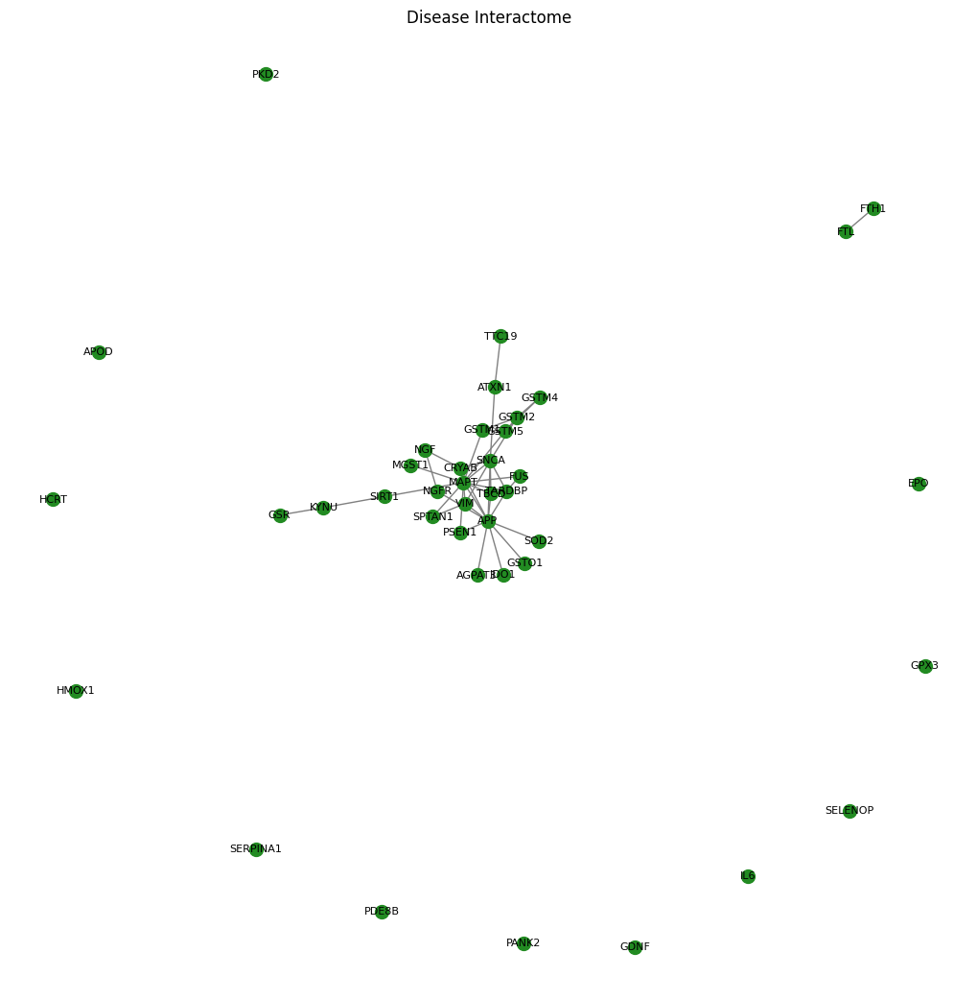

In [37]:
#Plot disease interactome
plt.figure(figsize=(10, 10))
nx.draw(disease_interactome, node_color='forestgreen', edge_color='gray', with_labels=True, node_size=100, font_size=8)
plt.title("Disease Interactome")
plt.show()

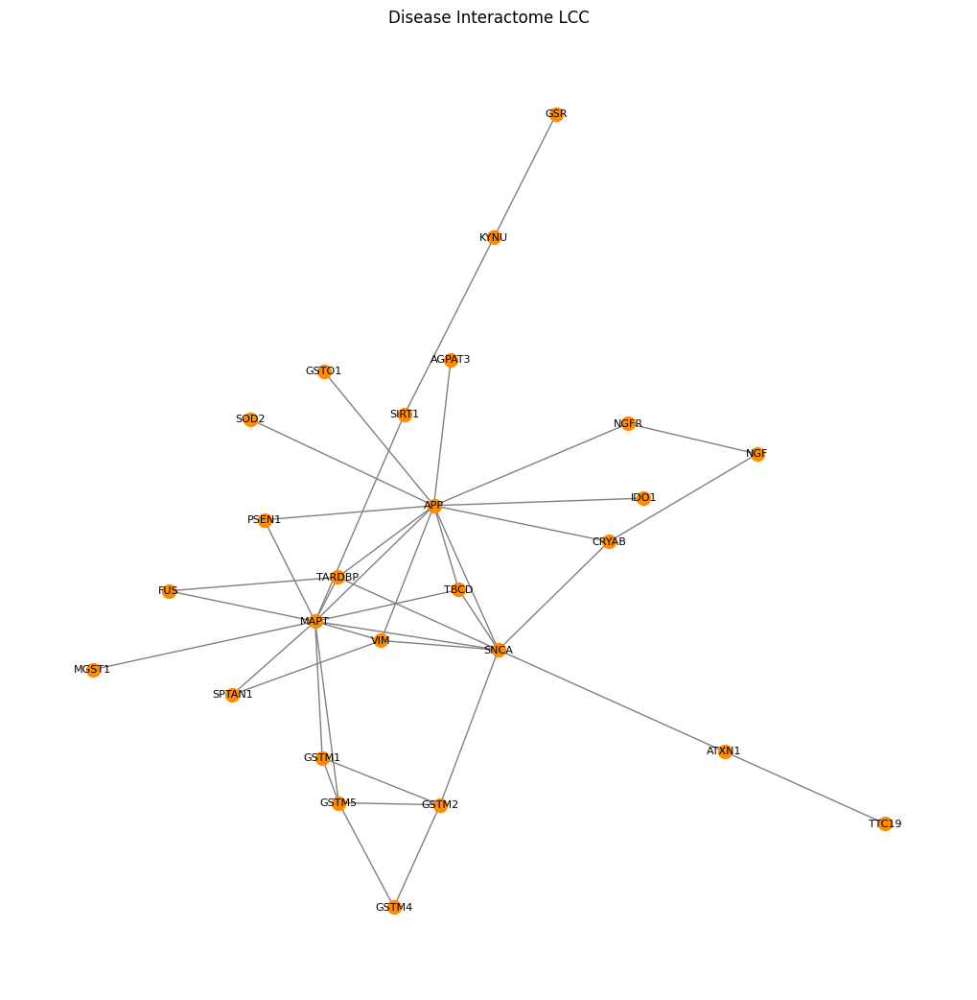

In [37]:
#Plot the 
plt.figure(figsize=(10, 10))
nx.draw(disease_LCC_G, node_color='darkorange', edge_color='gray', with_labels=True, node_size=100, font_size=8)
plt.title("Disease Interactome LCC")
plt.show()

Now we go on with the Tables and the metrics of the disease LCC.

In [35]:
#Table 1: Summary of GDAs and basic network data

Table1 = pd.DataFrame({
    'Disease name': "Degenerative disease of nervous system, unspecified.",
    'UMLS disease ID': "C0524851",
    'MeSH disease class': "D019636",
    'Number of associated genes': [number_of_genes_gda],
    'Number of genes present in the interactome': [disease_interactome.number_of_nodes()],
    'LCC size of the disease interactome': [disease_LCC_G.number_of_nodes()]
})

Table1

,Disease name,UMLS disease ID,MeSH disease class,Number of associated genes,Number of genes present in the interactome,LCC size of the disease interactome
0,"Degenerative disease of nervous system, unspec...",C0524851,D019636,40,40,26


In [36]:
#Network metrics
degrees = dict(disease_LCC_G.degree())
betweenness = nx.betweenness_centrality(disease_LCC_G)
eigenvector = nx.eigenvector_centrality(disease_LCC_G)
closeness = nx.closeness_centrality(disease_LCC_G)

net_measures = {}
for gene in disease_LCC_G.nodes():
    net_measures[gene] = {}
    net_measures[gene]["Degree"] = degrees[gene]
    net_measures[gene]["Betweenness"] = betweenness[gene]
    net_measures[gene]["Eigenvector centrality"] = eigenvector[gene]
    net_measures[gene]["Closeness centrality"] = closeness[gene]
    net_measures[gene]["ratio Betw./Degree"] = (betweenness[gene])/(degrees[gene])

In [37]:
#Table 2: Main network metrics of disease LCC genes

net_measures_df = pd.DataFrame.from_dict(net_measures, orient="index")
net_measures_df.sort_values(by=["Degree", "Betweenness"], ascending=[False, False], inplace=True)
net_measures_df.reset_index(inplace=True) 
net_measures_df.rename(columns={"index": "Gene name"}, inplace=True)
net_measures_df.insert(0, "Ranking", range(1, len(net_measures_df) + 1))
net_measures_df

,Ranking,Gene name,Degree,Betweenness,Eigenvector centrality,Closeness centrality,ratio Betw./Degree
0,1,MAPT,12,0.495278,0.473013,0.609756,0.041273
1,2,APP,12,0.426944,0.448481,0.581395,0.035579
2,3,SNCA,8,0.261111,0.387683,0.555556,0.032639
3,4,GSTM5,4,0.051389,0.149850,0.416667,0.012847
4,5,GSTM2,4,0.047222,0.136449,0.396825,0.011806
5,6,TARDBP,4,0.019167,0.269699,0.480769,0.004792
6,7,VIM,4,0.019167,0.269699,0.480769,0.004792
7,8,CRYAB,3,0.053889,0.164716,0.416667,0.017963
8,9,GSTM1,3,0.008056,0.141472,0.409836,0.002685
9,10,TBCD,3,0.000000,0.243918,0.471698,0.000000


Now we do the scatterplot.

C:\Users\sofyc\AppData\Local\Temp\ipykernel_19988\716107679.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(net_measures_df, x = "Degree", y = "Betweenness", palette = palette, s=100)


19 [-0.25091976  0.90142861]
20 [0.46398788 0.19731697]
21 [-0.68796272 -0.68801096]
22 [-0.88383278  0.73235229]
23 [0.20223002 0.41614516]
24 [-0.95883101  0.9398197 ]
25 [ 0.66488528 -0.57532178]
15 [-0.63635007 -0.63319098]
16 [-0.39151551  0.04951286]
17 [-0.13610996 -0.41754172]
18 [ 0.22370579 -0.72101228]
11 [-0.4157107  -0.26727631]
12 [-0.08786003  0.57035192]
5 [-0.60065244  0.02846888]
6 [ 0.18482914 -0.90709917]


Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


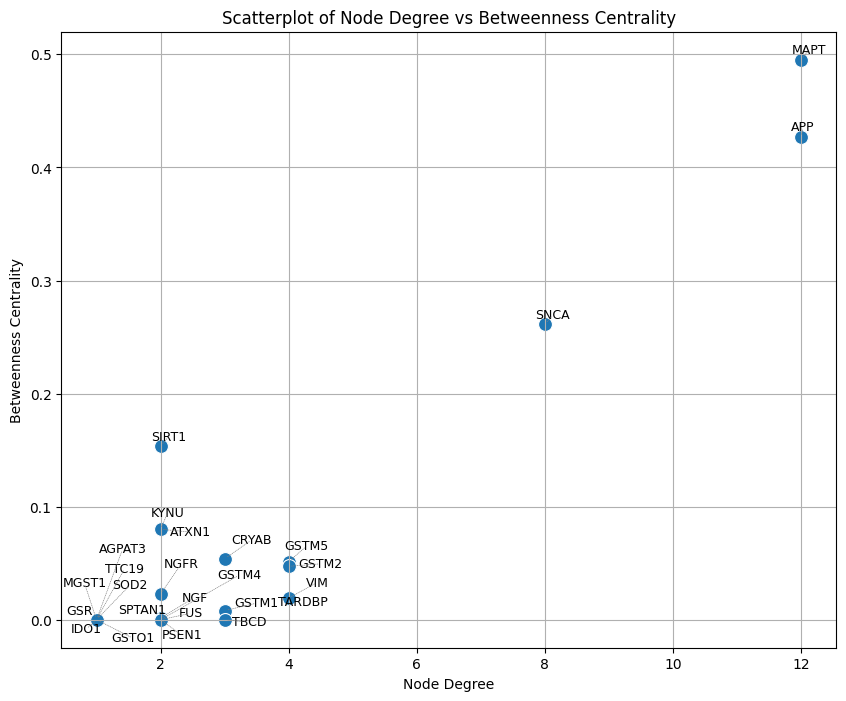

In [38]:
plt.figure(figsize=(10, 8))
palette = sns.color_palette("tab20", n_colors=len(net_measures_df['Gene name'].unique()))
sns.scatterplot(net_measures_df, x = "Degree", y = "Betweenness", palette = palette, s=100)

texts = []
for i in range(len(net_measures_df)):
    texts.append(plt.text(
        x=net_measures_df['Degree'][i],
        y=net_measures_df['Betweenness'][i],
        s=net_measures_df['Gene name'][i],
        fontsize=9,
        ha='center',
        va='bottom'
    ))
    
adjust_text(
    texts, 
    expand_text=(1.2, 1.4),  # Increase the distance between labels
    expand_points=(1.1, 1.3),  # Adjusts the distance between points
    force_text=(0.5, 1.5),  # Move labels more effectively
    lim=100,
    arrowprops=dict(
            arrowstyle='-', 
            color='gray',   
            lw=0.5,          
            linestyle='dotted'))

plt.xlabel("Node Degree")
plt.ylabel("Betweenness Centrality")
plt.title("Scatterplot of Node Degree vs Betweenness Centrality")
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Gene Names')
#plt.savefig(f'{data_dir}results_files/deg_bet_scatterplot.png', bbox_inches='tight')
plt.grid(True)
plt.show()

## 2. Comparative analysis of the disease genes identification algorithms

### 2.1. Use the following algorithms to infer and then validate (point 2.2) putative disease genes

- ### **DIAMOnD**

The linked github repository was cloned with the following codes in the command line: \
**Personal repository path in personal laptop** \
**git clone https://github.com/dinaghiassian/DIAMOnD.git**

To make the repository usable, we have to import it in the python path:

In [39]:
import sys
from pathlib import Path

# Path to the DIAMOnD repository
diamond_path = Path("DIAMOnD")

# Add the DIAMOnD repository to Python's module search path
sys.path.append(str(diamond_path))

Now we can import the script containing the desired functions. There was just a minor change we did in the script line 405 (see script in zip file) to ensure it's possible to run the algorithm without saving the results in an external file.

In [40]:
import DIAMOnD as diamond

Now we can already run the algorithm. As the human interactome and the human interactome LCC are identical, it doesn't matter, which of the two we choose as input. We decide to go with all the nodes of the disease interactome as seed genes and not with the disease interactome LCC. Alpha is set to one (default value) which ensures no  penalization for hubs. Max number of added nodes is set to 100 to ensure compatibility with exercise 3.1.

In [41]:
disease_interactome_nodes = sorted(list(disease_interactome.nodes))
with open('nodes_disease_interactome_sorted.txt', 'w') as f:
    for node in disease_interactome_nodes:
        f.write(f"{node}\n")

We use the read_input function from the DIAMOnD script, to ensure having the correct input format

In [42]:
alg_network, seeds_algs = diamond.read_input("PPI.tsv", 'nodes_disease_interactome_sorted.txt') 

In [44]:
added_nodes = diamond.DIAMOnD(G_original = alg_network,
                          seed_genes = seeds_algs,
                          max_number_of_added_nodes = 100, alpha = 1,
                          outfile=None)

We display the results in a dataframe.

In [45]:
diamond_df = pd.DataFrame(added_nodes, columns =['Gene', 'Degree', 'Number_of_disease_neighbours', 'p-value'])
diamond_df

,Gene,Degree,Number_of_disease_neighbours,p-value
0,SQSTM1,1208,13,[3.5240871335743335e-07]
1,HSPB1,698,11,[1.0658498470745436e-07]
2,MAP1LC3B,542,10,[1.3436374012024465e-07]
3,GSTM3,147,7,[2.6169679852600735e-08]
4,EEF2,523,10,[1.5514231773724727e-07]
...,...,...,...,...
95,UBE2H,1959,79,[8.985412099784937e-45]
96,FLNA,596,53,[3.295104777643048e-45]
97,FASN,386,47,[4.599052101298715e-46]
98,HEXIM1,908,62,[3.51096592772627e-46]


- ### **DiaBLE** with dynamic universe size used in the hypergeometric function.

For the DiaBLE algorithm we changed the Universe size of the Diamond algorithm (see script in zip file).Note to changes: Dynamic calculation of universe size was added, function p_value is called with the new dyna,ic universe size and not N as before. All the other functions didn't need changing. We then run it with the same parameters as the DIAMOnD algorithm. 

To run the seperate script we again have to add is to our python path.

In [ ]:
# Path to the DiaBLE repository
diable_path = Path("DiaBLE")

# Add the DiaBLE repository to Python's module search path
sys.path.append(str(diable_path))

In [47]:
import DiaBLE as diable

In [48]:
added_nodes_diable = diable.DiaBLE(G_original = alg_network,
                          seed_genes = seeds_algs,
                          max_number_of_added_nodes = 100, alpha = 1,
                          outfile=None)

We again display our results in a dataframe.

In [49]:
# create DataFrame using data
df_diable = pd.DataFrame(added_nodes_diable, columns =['Gene', 'Degree', 'Number_of_disease_neighbours', 'p-value'])

df_diable

,Gene,Degree,Number_of_disease_neighbours,p-value
0,MDH1,143,6,[4.271811487798163e-07]
1,GSTM3,147,6,[5.838688380731079e-07]
2,SQSTM1,1208,13,[8.297663179955071e-07]
3,PINK1,678,11,[1.6197055635389483e-07]
4,MAP1LC3B,542,11,[2.1522005737820517e-08]
...,...,...,...,...
95,KEAP1,275,22,[1.4999004995867063e-17]
96,YWHAE,1154,39,[2.7936202089515615e-17]
97,MAP3K2,69,14,[3.171628004367761e-17]
98,YWHAZ,1178,40,[1.4590249477132935e-17]


- ### **Diffusion-based algorithm** with diffusion times (arbitrary unit): t=0.002, 0.005, 0.01.

The diffusion-based algorithm was stolen from the lab. I checked its correctness, but still have another look at it.

In [50]:
from numpy import array
from scipy.sparse import csc_matrix
from scipy.sparse.linalg import expm_multiply

def diffuse(matrix, heat_array, time):
    return expm_multiply(-matrix, heat_array, start=0, stop=time, endpoint=True)[-1]

def sparse_laplacian(network, normalize=False):
    if normalize:
        return csc_matrix(nx.normalized_laplacian_matrix(network))
    else:
        return csc_matrix(nx.laplacian_matrix(network))

def create_heat_array(network, seed_genes, heat_value=1.0):
    heat_list = []
    for node in network.nodes:
        if node in seed_genes:
            heat_list.append(heat_value)
        else:
            heat_list.append(0.0)

    return array(heat_list)

def filter_node_list(node_list, nodes_to_remove):
    filtered_nodes = []
    for item in node_list:
        if item[0] not in nodes_to_remove:
            filtered_nodes.append(item[0])

    return filtered_nodes

def run_heat_diffusion(network, seed_genes, diffusion_time=0.005, n_positions=None):
    # Get the sparse Lapliacian matrix of the network.
    matrix = sparse_laplacian(network, normalize=True)

    # Create heat array.
    heat_array = create_heat_array(network, seed_genes)

    # Diffuse heat.
    diffused_heat_array = diffuse(matrix, heat_array, diffusion_time)

    # Get the heat of each node.
    node_heat = {node_name: diffused_heat_array[i] for i, node_name in enumerate(network.nodes())}

    # Sort the nodes by heat value.
    sorted_nodes = sorted(node_heat.items(), key=lambda x:x[1], reverse=True)

    # Remove from the sorted nodes the seed genes.
    predicted_genes = filter_node_list(sorted_nodes, seed_genes)

    if n_positions:
        # Return the top `n_positions` genes
        # wrt their heat value.
        return predicted_genes[:n_positions]

    return predicted_genes

We run it for all different diffusion times and store the results in a dataframe

In [51]:
diffusion_times = [0.002, 0.005, 0.01]
results = {}

for t in diffusion_times:
    results[t] = run_heat_diffusion(
    network= PPI,
    seed_genes=disease_interactome_nodes,
    diffusion_time=t,
    n_positions=100)

In [52]:
df_diffusion = pd.DataFrame()
df_diffusion['t = 0.01'] = results[0.01]
df_diffusion['t = 0.002'] = results[0.002]
df_diffusion['t = 0.005'] = results[0.005]
df_diffusion

,t = 0.01,t = 0.002,t = 0.005
0,ZC3H12B,ZC3H12B,ZC3H12B
1,UCP1,UCP1,UCP1
2,CD24,CD24,CD24
3,TP53I3,TP53I3,TP53I3
4,SELPLG,SELPLG,SELPLG
...,...,...,...
95,AP1M1,AP1M1,AP1M1
96,B3GNTL1,B3GNTL1,B3GNTL1
97,PGBD2,PGBD2,PGBD2
98,MVD,MVD,MVD


### 2.2.	Computational validation
- ### Perform a 5-fold cross validation: split the disease genes set $S_0$ into 5 subsets. Each time, select one subset as probe set $S_P$ and the remaining four subsets as training set ST. Run the algorithm of your choice using the $S_T$ sets and check the output for genes in the SP set. IMPORTANT: in the Diffusion ranking you will find the seed genes (heat input=1) and the putative disease genes (heat input=0) predicted by the algorithm mixed together: clearly you must eliminate the seed genes (heat input=1) before carrying out the cross validation. This is also valid for point 3.1 if the best performing algorithm is Diffusion
- ### Compute the following performance metrics:
    - ### precision (average ± SD)
    - ### recall (average ±SD)
    - ### F1-score (average ±SD)
- ### Provide the performance measures selecting the top 50 positions and the top $X$ positions where $X = (\frac{1}{10})n$, $(\frac{1}{4})n$, $(\frac{1}{2})n$, $n$, with $n$=number of known GDAs (i.e., number of disease’s seed genes).

For the 5-fold cross validation we write a seperate function to compute the metrics. The folds are created using the KFold library. We calculate the metrics for every fold, in order to later analyse the performance of the algorithms on specific folds. The dataframes with the metrics for each fold are stored as values in a dictionnary. From this dictionry the average metrics for each n are extracted to create the dataframe requested in the assignment.

In [53]:
from sklearn.model_selection import KFold

In [54]:
def evaluate_performance(predicted_genes, test_genes):
    true_positive = len(set(predicted_genes) & set(test_genes))
    precision = true_positive / len(predicted_genes) if predicted_genes else 0
    recall = true_positive / len(test_genes) if test_genes else 0
    f1_score = (
        2 * precision * recall / (precision + recall)
        if (precision + recall) > 0 else 0
    )
    return true_positive, precision, recall, f1_score

- ### DIAMOnD

In [55]:
def cross_validation_diamond(human_interactome_lcc,disease_interactome_lcc_nodes, n_added_nodes):
    
    #Initialize the k-fold splitting
    kf = KFold(n_splits=5, shuffle=True, random_state=2)
    
    # Convert to numpy array for indexing
    disease_genes = np.sort(np.array(disease_interactome_lcc_nodes))
    #Initialize empty list to store resluts
    true_positives, precisions, recalls, f1_scores = [], [], [], []
    
    #Do the actual splitting
    for train_index, test_index in kf.split(disease_genes):
        train_genes = disease_genes[train_index]
        test_genes = disease_genes[test_index]
    
        #Run the diamond algorithm
        result = diamond.DIAMOnD(G_original = human_interactome_lcc,
                            seed_genes = train_genes.tolist(),
                            max_number_of_added_nodes = n_added_nodes, alpha = 1,
                            outfile=None)
        
        #Convert result to list
        result = pd.DataFrame(result, columns =['Gene', 'Degree', 'Number_of_disease_neighbours', 'p-value'])
        predicted_genes = result['Gene'].tolist()
        
        #Calculate performance 
        true_positive, precision, recall, f1_score = evaluate_performance(predicted_genes, test_genes.tolist())
        
        # Store metrics
        true_positives.append(true_positive)
        precisions.append(precision)
        recalls.append(recall)
        f1_scores.append(f1_score)
    
    
   # Aggregate results
    avg_precision = np.mean(precisions)
    std_precision = np.std(precisions)
    precisions.append(f"{avg_precision:.4f} ± {std_precision:.4f}")

    avg_recall = np.mean(recalls)
    std_recall = np.std(recalls)
    recalls.append(f"{avg_recall:.4f} ± {std_recall:.4f}")

    avg_f1_score = np.mean(f1_scores)
    std_f1_score = np.std(f1_scores)
    f1_scores.append(f"{avg_f1_score:.4f} ± {std_f1_score:.4f}")

    avg_true_positive = np.mean(true_positives)
    std_true_positive = np.std(true_positives)
    true_positives.append(f"{avg_true_positive:.4f} ± {std_true_positive:.4f}")
    
    #Create list for fold column later
    folds = [1, 2, 3, 4, 5, "Average"]
    
    #Create dataframe
    metrics = pd.DataFrame()
    folds = [1, 2, 3, 4, 5, "Average"]
    metrics['Fold'] = folds
    metrics['Precision'] = precisions
    metrics['recall'] = recalls
    metrics['F1 score'] = f1_scores
    metrics['True_positive'] = true_positives

    metrics.attrs['title'] = f"Cross-Validation Metrics for DIAMOnD Algorithm Top {n_added_nodes} positions"
    return metrics

In [56]:
positions = [50, 40, 20, 10, 4]
diamond_metrics_dict = {}
for position in positions:
    metrics = cross_validation_diamond(alg_network, disease_interactome_nodes, position)
    diamond_metrics_dict[position] = metrics  

In [57]:
#Create new dataframe 
diamond_metrics_df = pd.DataFrame([df.iloc[5] for df in diamond_metrics_dict.values()])

#Columns to delete
columns_to_delete = ['Fold', 'True_positive']  

#Delete these columns
diamond_metrics_df = diamond_metrics_df.drop(columns=columns_to_delete, errors='ignore')

#Add a new column with number genes to predict at position 0
new_column_data = [50, 40, 20, 10, 4]  
diamond_metrics_df.insert(0, 'X', new_column_data)

#Reset index
diamond_metrics_df.reset_index(drop=True, inplace=True)

#Take a look
diamond_metrics_df

,X,Precision,recall,F1 score
0,50,0.0120 ± 0.0160,0.0750 ± 0.1000,0.0207 ± 0.0276
1,40,0.0150 ± 0.0200,0.0750 ± 0.1000,0.0250 ± 0.0333
2,20,0.0300 ± 0.0400,0.0750 ± 0.1000,0.0429 ± 0.0571
3,10,0.0600 ± 0.0800,0.0750 ± 0.1000,0.0667 ± 0.0889
4,4,0.1000 ± 0.2000,0.0500 ± 0.1000,0.0667 ± 0.1333


- ### DiaBLE

In [58]:
def cross_validation_diable(human_interactome_lcc,disease_interactome_lcc_nodes, n_added_nodes):
    
    #Initialize the k-fold splitting
    kf = KFold(n_splits=5, shuffle=True, random_state=2)
    
    # Convert to numpy array for indexing
    disease_genes = np.sort(np.array(disease_interactome_lcc_nodes))
    #Initialize empty list to store resluts
    true_positives, precisions, recalls, f1_scores = [], [], [], []
    
    #Do the actual splitting
    for train_index, test_index in kf.split(disease_genes):
        train_genes = disease_genes[train_index]
        test_genes = disease_genes[test_index]
    
        #Run the diable algorithm
        result_diable = diable.DiaBLE(G_original = human_interactome_lcc,
                            seed_genes = train_genes.tolist(),
                            max_number_of_added_nodes = n_added_nodes, alpha = 1,
                            outfile=None)
        
        #Convert result to list
        result_diable = pd.DataFrame(result_diable, columns =['Gene', 'Degree', 'Number_of_disease_neighbours', 'p-value'])   
        predicted_genes = result_diable['Gene'].tolist()
        
        #Calculate performance 
        true_positive, precision, recall, f1_score = evaluate_performance(predicted_genes, test_genes.tolist())
        
        # Store metrics
        true_positives.append(true_positive)
        precisions.append(precision)
        recalls.append(recall)
        f1_scores.append(f1_score)
    
    
   # Aggregate results
    avg_precision = np.mean(precisions)
    std_precision = np.std(precisions)
    precisions.append(f"{avg_precision:.4f} ± {std_precision:.4f}")

    avg_recall = np.mean(recalls)
    std_recall = np.std(recalls)
    recalls.append(f"{avg_recall:.4f} ± {std_recall:.4f}")

    avg_f1_score = np.mean(f1_scores)
    std_f1_score = np.std(f1_scores)
    f1_scores.append(f"{avg_f1_score:.4f} ± {std_f1_score:.4f}")

    avg_true_positive = np.mean(true_positives)
    std_true_positive = np.std(true_positives)
    true_positives.append(f"{avg_true_positive:.4f} ± {std_true_positive:.4f}")
    
    #Create list for fold column later
    folds = [1, 2, 3, 4, 5, "Average"]
    
    #Create dataframe
    metrics = pd.DataFrame()
    folds = [1, 2, 3, 4, 5, "Average"]
    metrics['Fold'] = folds
    metrics['Precision'] = precisions
    metrics['recall'] = recalls
    metrics['F1 score'] = f1_scores
    metrics['True_positive'] = true_positives
    
    return metrics

In [59]:
positions = [50, 40, 20, 10, 4]
diable_metrics_dict = {}
for position in positions:
    metrics = cross_validation_diable(alg_network, disease_interactome_nodes, position)
    diable_metrics_dict[position] = metrics  

In [60]:
#Create new dataframe 
diable_metrics_df = pd.DataFrame([df.iloc[5] for df in diable_metrics_dict.values()])

#Columns to delete
columns_to_delete = ['Fold', 'True_positive']  

#Delete these columns
diable_metrics_df = diable_metrics_df.drop(columns=columns_to_delete, errors='ignore')

#Add a new column with number genes to predict at position 0
new_column_data = [50, 40, 20, 10, 4]  
diable_metrics_df.insert(0, 'X', new_column_data)

#Reset index
diable_metrics_df.reset_index(drop=True, inplace=True)

#Take a look
diable_metrics_df

,X,Precision,recall,F1 score
0,50,0.0120 ± 0.0160,0.0750 ± 0.1000,0.0207 ± 0.0276
1,40,0.0150 ± 0.0200,0.0750 ± 0.1000,0.0250 ± 0.0333
2,20,0.0300 ± 0.0400,0.0750 ± 0.1000,0.0429 ± 0.0571
3,10,0.0600 ± 0.0800,0.0750 ± 0.1000,0.0667 ± 0.0889
4,4,0.1000 ± 0.2000,0.0500 ± 0.1000,0.0667 ± 0.1333


- ### Heat diffusion

In [61]:
def cross_validation_diffusion(human_interactome_lcc,disease_interactome_lcc_nodes, diffusion_time, n_added_nodes):
    
    #Initialize the k-fold splitting
    kf = KFold(n_splits=5, shuffle=True, random_state=2)
    
    # Convert to numpy array for indexing
    disease_genes = np.sort(np.array(disease_interactome_lcc_nodes))
    #Initialize empty list to store resluts
    true_positives, precisions, recalls, f1_scores = [], [], [], []
    
    #Do the actual splitting
    for train_index, test_index in kf.split(disease_genes):
        train_genes = disease_genes[train_index]
        test_genes = disease_genes[test_index]
    
        #Run the diffusion algorithm
        predicted_genes = run_heat_diffusion(network=human_interactome_lcc, seed_genes=train_genes.tolist(),diffusion_time=diffusion_time,n_positions=n_added_nodes)
        
        #Calculate performance 
        true_positive, precision, recall, f1_score = evaluate_performance(predicted_genes, test_genes.tolist())
        
        # Store metrics
        true_positives.append(true_positive)
        precisions.append(precision)
        recalls.append(recall)
        f1_scores.append(f1_score)
    
    
    #Aggregate results
    avg_precision = np.mean(precisions)
    std_precision = np.std(precisions)
    precisions.append(f"{avg_precision:.4f} ± {std_precision:.4f}")

    avg_recall = np.mean(recalls)
    std_recall = np.std(recalls)
    recalls.append(f"{avg_recall:.4f} ± {std_recall:.4f}")

    avg_f1_score = np.mean(f1_scores)
    std_f1_score = np.std(f1_scores)
    f1_scores.append(f"{avg_f1_score:.4f} ± {std_f1_score:.4f}")

    avg_true_positive = np.mean(true_positives)
    std_true_positive = np.std(true_positives)
    true_positives.append(f"{avg_true_positive:.4f} ± {std_true_positive:.4f}")
    
    #Create list for fold column later
    folds = [1, 2, 3, 4, 5, "Average"]
    
    #Create dataframe
    metrics = pd.DataFrame()
    folds = [1, 2, 3, 4, 5, "Average"]
    metrics['Fold'] = folds
    metrics['Precision'] = precisions
    metrics['recall'] = recalls
    metrics['F1 score'] = f1_scores
    metrics['True_positive'] = true_positives
    
    return metrics

In [62]:
positions = [50, 40, 20, 10, 4]
diffusion_metrics_dict_001 = {}
for position in positions:
    metrics = cross_validation_diffusion(alg_network, disease_interactome_nodes,0.01, position)
    diffusion_metrics_dict_001[position] = metrics  

In [63]:
#Create new dataframe 
diffusion_metrics_df_001 = pd.DataFrame([df.iloc[5] for df in diffusion_metrics_dict_001.values()])

#Columns to delete
columns_to_delete = ['Fold', 'True_positive']  

#Delete these columns
diffusion_metrics_df_001 = diffusion_metrics_df_001.drop(columns=columns_to_delete, errors='ignore')

#Add a new column with number genes to predict at position 0
new_column_data = [50, 40, 20, 10, 4]  
diffusion_metrics_df_001.insert(0, 'X', new_column_data)

#Reset index
diffusion_metrics_df_001.reset_index(drop=True, inplace=True)

#Take a look
diffusion_metrics_df_001

,X,Precision,recall,F1 score
0,50,0.0240 ± 0.0150,0.1500 ± 0.0935,0.0414 ± 0.0258
1,40,0.0300 ± 0.0187,0.1500 ± 0.0935,0.0500 ± 0.0312
2,20,0.0500 ± 0.0447,0.1250 ± 0.1118,0.0714 ± 0.0639
3,10,0.0600 ± 0.0490,0.0750 ± 0.0612,0.0667 ± 0.0544
4,4,0.1500 ± 0.1225,0.0750 ± 0.0612,0.1000 ± 0.0816


In [64]:
positions = [50, 40, 20, 10, 4]
diffusion_metrics_dict_0005 = {}
for position in positions:
    metrics = cross_validation_diffusion(alg_network, disease_interactome_nodes,0.005, position)
    diffusion_metrics_dict_0005[position] = metrics

In [65]:
#Create new dataframe 
diffusion_metrics_df_0005 = pd.DataFrame([df.iloc[5] for df in diffusion_metrics_dict_0005.values()])

#Columns to delete
columns_to_delete = ['Fold', 'True_positive']  

#Delete these columns
diffusion_metrics_df_0005 = diffusion_metrics_df_0005.drop(columns=columns_to_delete, errors='ignore')

#Add a new column with number genes to predict at position 0
new_column_data = [50, 40, 20, 10, 4]  
diffusion_metrics_df_0005.insert(0, 'X', new_column_data)

#Reset index
diffusion_metrics_df_0005.reset_index(drop=True, inplace=True)

#Take a look
diffusion_metrics_df_0005

,X,Precision,recall,F1 score
0,50,0.0240 ± 0.0150,0.1500 ± 0.0935,0.0414 ± 0.0258
1,40,0.0300 ± 0.0187,0.1500 ± 0.0935,0.0500 ± 0.0312
2,20,0.0500 ± 0.0447,0.1250 ± 0.1118,0.0714 ± 0.0639
3,10,0.0600 ± 0.0490,0.0750 ± 0.0612,0.0667 ± 0.0544
4,4,0.1500 ± 0.1225,0.0750 ± 0.0612,0.1000 ± 0.0816


In [66]:
positions = [50, 40, 20, 10, 4]
diffusion_metrics_dict_0002 = {}
for position in positions:
    metrics = cross_validation_diffusion(alg_network, disease_interactome_nodes,0.002, position)
    diffusion_metrics_dict_0002[position] = metrics

In [67]:
#Create new dataframe 
diffusion_metrics_df_0002 = pd.DataFrame([df.iloc[5] for df in diffusion_metrics_dict_0002.values()])

#Columns to delete
columns_to_delete = ['Fold', 'True_positive']  

#Delete these columns
diffusion_metrics_df_0002 = diffusion_metrics_df_0002.drop(columns=columns_to_delete, errors='ignore')

#Add a new column with number genes to predict at position 0
new_column_data = [50, 40, 20, 10, 4]  
diffusion_metrics_df_0002.insert(0, 'X', new_column_data)

#Reset index
diffusion_metrics_df_0002.reset_index(drop=True, inplace=True)

#Take a look
diffusion_metrics_df_0002

,X,Precision,recall,F1 score
0,50,0.0240 ± 0.0150,0.1500 ± 0.0935,0.0414 ± 0.0258
1,40,0.0300 ± 0.0187,0.1500 ± 0.0935,0.0500 ± 0.0312
2,20,0.0500 ± 0.0447,0.1250 ± 0.1118,0.0714 ± 0.0639
3,10,0.0600 ± 0.0490,0.0750 ± 0.0612,0.0667 ± 0.0544
4,4,0.1500 ± 0.1225,0.0750 ± 0.0612,0.1000 ± 0.0816


## 3. Putative disease gene identification

### 3.1. According to the performance metrics obtained in the validation phase at point 2:
- ### select the best performing algorithm and apply the process to predict new putative disease genes using all known GDAs as seed genes
- ### obtain a list of 100 putative disease genes.

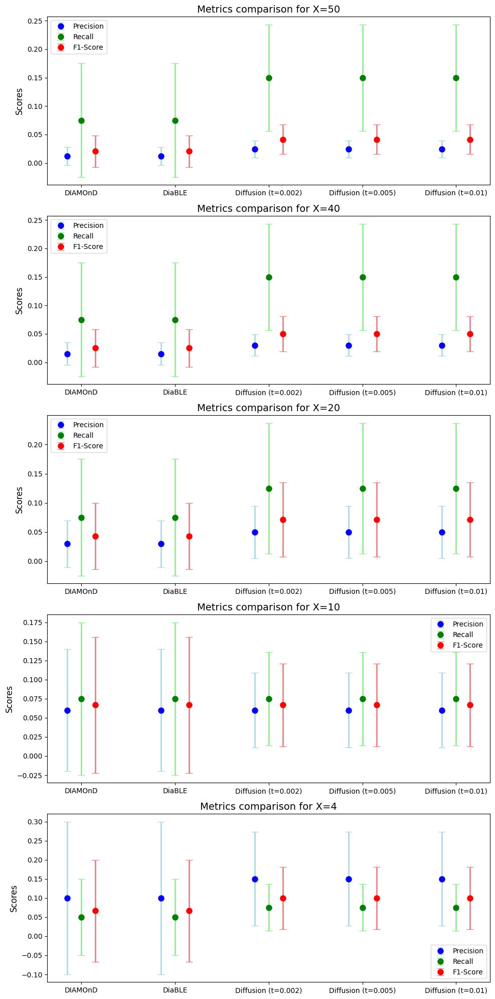

In [68]:
#Grupifying the datasets
diamond_metrics_df["Algorithm"] = "DIAMOnD"
diable_metrics_df["Algorithm"] = "DiaBLE"
diffusion_metrics_df_0002["Algorithm"] = "Diffusion (t=0.002)"
diffusion_metrics_df_0005["Algorithm"] = "Diffusion (t=0.005)"
diffusion_metrics_df_001["Algorithm"] = "Diffusion (t=0.01)"

metrics_df = pd.concat([
    diamond_metrics_df,
    diable_metrics_df,
    diffusion_metrics_df_0002,
    diffusion_metrics_df_0005,
    diffusion_metrics_df_001
])

#Extract the mean and the std from the metrics
def mean_std_metrics(column):
    means = column.str.split(" ± ").str[0].astype(float)
    spreads = column.str.split(" ± ").str[1].astype(float)
    return means, spreads

#Extract the metrics
metrics_df["Precision_mean"], metrics_df["Precision_std"] = mean_std_metrics(metrics_df["Precision"])
metrics_df["Recall_mean"], metrics_df["Recall_std"] = mean_std_metrics(metrics_df["recall"])
metrics_df["F1_mean"], metrics_df["F1_std"] = mean_std_metrics(metrics_df["F1 score"])

#Creation of the grid
X_val = metrics_df["X"].unique()

fig, axes = plt.subplots(5, 1, figsize=(10, 20))

for i, X_i in enumerate(X_val):
    subset_df = metrics_df[metrics_df["X"] == X_i]
    
    #Parameters of the plot
    algorithms = subset_df["Algorithm"]
    x = np.arange(len(algorithms))  #Indices for the algorithms
    width = 0.15  #Width of each group
    
    #Precision
    axes[i].errorbar(x - width, subset_df["Precision_mean"], yerr=subset_df["Precision_std"], fmt='o', 
                     label='Precision', color='blue', ecolor='lightblue', elinewidth=2, capsize=5, markersize=8)
    #Recall
    axes[i].errorbar(x, subset_df["Recall_mean"], yerr=subset_df["Recall_std"], fmt='o', 
                     label='Recall', color='green', ecolor='lightgreen', elinewidth=2, capsize=5, markersize=8)
    
    #F1 Score
    axes[i].errorbar(x + width, subset_df["F1_mean"], yerr=subset_df["F1_std"], fmt='o', 
                     label='F1-Score', color='red', ecolor='lightcoral', elinewidth=2, capsize=5, markersize=8)
    
    axes[i].set_title(f"Metrics comparison for X={X_i}", fontsize=14)
    axes[i].set_ylabel("Scores", fontsize=12)
    axes[i].set_xticks(x)
    axes[i].set_xticklabels(algorithms)
    axes[i].legend()

plt.tight_layout()
plt.show()


We compared the three different algorithms through the method of *5-fold cross validation* (performed in 2.2). The metrics calculated were Precision, Recall and F1 Score and the performances were analyzed for different levels $X$ of top genes. In the graph there are shown also the standard deviations, i.e. the uncertainty, of each metric for each algorithm, represented by error bars. As we can see, in all the algorithms, we have a better Precision and F1 Score for lower $X$, while Recall performs better for higher $X$. This makes sense, due to the inverse relationship between Precision and Recall metric, known in literature. \
The best algorithm from this analysis and based on these data, seems to be the Diffusion-based algorithm, since the performances are higher than DIAMoND and DiaBLE. However, based on next analysis, we will select DiaBLE as the best algorithm.

### 3.2. Enrichment analysis
- ### perform the enrichment analysis (via EnrichR: GO-BP, GO-MF, GO-CC, Reactome and KEGG pathways) over the putative disease genes

In [69]:
#Select the putative genes from Diffusion-based algorithm with t=0.005
putative_disease_genes = list(df_diffusion['t = 0.005'])
putative_disease_genes

['ZC3H12B',
 'UCP1',
 'CD24',
 'TP53I3',
 'SELPLG',
 'GFRA2',
 'PDE8A',
 'ITGA9',
 'GSTM3',
 'DAO',
 'HRH1',
 'GP1BA',
 'SORCS3',
 'AGPAT1',
 'IL6R',
 'MLN',
 'HLA-DQA1',
 'QRICH2',
 'B4GALT6',
 'VCAN',
 'CAPN9',
 'CCR1',
 'PPP1R16A',
 'FCRL1',
 'ZC3H12A',
 'SERPING1',
 'ANKRD65',
 'MAN2B1',
 'SOX2-OT',
 'PANK3',
 'OVCA2',
 'USF2',
 'IFITM5',
 'ZNF836',
 'APLP1',
 'LOC401442',
 'SPATC1',
 'ZBTB16',
 'FAM3D',
 'PEPD',
 'FBXL17',
 'EPOR',
 'SAT2',
 'GOT1L1',
 'SCAMP5',
 'IGSF21',
 'PMPCB',
 'CASP6',
 'SNX27',
 'GSAP',
 'CA13',
 'SNX17',
 'SH3GL2',
 'SLC13A1',
 'ART4',
 'GRIN3B',
 'SORT1',
 'PYURF',
 'VSIG8',
 'KIAA1456',
 'PRSS42',
 'SLC22A18AS',
 'PKD2L2',
 'ELOVL6',
 'FLJ22447',
 'LINC00470',
 'ADAMTS9-AS2',
 'XKR5',
 'FOXO1',
 'UCHL1',
 'B4GALT5',
 'RXFP3',
 'CHRM4',
 'OR2L13',
 'MAN1A1',
 'UBQLN1',
 'MDH1',
 'CYP4F12',
 'RASGRF2',
 'LALBA',
 'FNDC1',
 'KCTD15',
 'C15orf32',
 'MAGEH1',
 'TMPRSS12',
 'SHISA9',
 'AKIP1',
 'ARL6IP6',
 'CD300E',
 'MMP19',
 'GSDMB',
 'HSPB6',
 'S100A6',
 '

In [70]:
#We use the function get_library_name to download all the databases available from EnrichR
databases = get_library_name()
words_to_search = ["GO_Biological", "GO_Molecular", "GO_Cellular", "Reactome", "KEGG"]
#GO_Biological stands for GO-BP
#GO_Molecular stands for GO-MF
#GO_Cellular stands for GO-CC

#We filter the databases whose name includes one of the words to search
filtered_databases = [db for db in databases if any(keyword in db for keyword in words_to_search)]
print(list(filtered_databases))

['GO_Biological_Process_2013', 'GO_Biological_Process_2015', 'GO_Biological_Process_2017', 'GO_Biological_Process_2017b', 'GO_Biological_Process_2018', 'GO_Biological_Process_2021', 'GO_Biological_Process_2023', 'GO_Cellular_Component_2013', 'GO_Cellular_Component_2015', 'GO_Cellular_Component_2017', 'GO_Cellular_Component_2017b', 'GO_Cellular_Component_2018', 'GO_Cellular_Component_2021', 'GO_Cellular_Component_2023', 'GO_Molecular_Function_2013', 'GO_Molecular_Function_2015', 'GO_Molecular_Function_2017', 'GO_Molecular_Function_2017b', 'GO_Molecular_Function_2018', 'GO_Molecular_Function_2021', 'GO_Molecular_Function_2023', 'KEGG_2013', 'KEGG_2015', 'KEGG_2016', 'KEGG_2019_Human', 'KEGG_2019_Mouse', 'KEGG_2021_Human', 'Reactome_2013', 'Reactome_2015', 'Reactome_2016', 'Reactome_2022', 'Reactome_Pathways_2024']


In [71]:
#We consider just these databases
databases = ['GO_Biological_Process_2023', 'GO_Cellular_Component_2023', 'GO_Molecular_Function_2023', 'KEGG_2021_Human', 'Reactome_Pathways_2024']

#Perform enrichment analysis
enr = enrichr(gene_list=putative_disease_genes,
                 gene_sets=databases,
                 organism='human')

# Convert results to a DataFrame
results = enr.results
results.columns

Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes'],
      dtype='object')

In [72]:
results

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2023,Central Nervous System Myelination (GO:0022010),2/11,0.001322,0.202050,0,0,45.104308,298.984305,B4GALT6;B4GALT5
1,GO_Biological_Process_2023,Central Nervous System Neuron Axonogenesis (GO...,2/11,0.001322,0.202050,0,0,45.104308,298.984305,B4GALT6;B4GALT5
2,GO_Biological_Process_2023,"RNA Phosphodiester Bond Hydrolysis, Endonucleo...",2/14,0.002166,0.202050,0,0,33.823129,207.504274,ZC3H12B;ZC3H12A
3,GO_Biological_Process_2023,Glycoprotein Metabolic Process (GO:0009100),3/53,0.002370,0.202050,0,0,12.278351,74.219914,MAN1A1;MAN2B1;B4GALT5
4,GO_Biological_Process_2023,Ganglioside Biosynthetic Process (GO:0001574),2/15,0.002491,0.202050,0,0,31.219780,187.166877,B4GALT6;B4GALT5
...,...,...,...,...,...,...,...,...,...,...
1301,Reactome_Pathways_2024,Signaling by Rho GTPases,1/672,0.967494,0.977377,0,0,0.289467,0.009566,RASGRF2
1302,Reactome_Pathways_2024,Viral Infection Pathways,2/1029,0.967646,0.977377,0,0,0.375037,0.012335,IL6R;AP1M1
1303,Reactome_Pathways_2024,"Signaling by Rho GTPases, Miro GTPases and RHO...",1/688,0.970083,0.977377,0,0,0.282490,0.008580,RASGRF2
1304,Reactome_Pathways_2024,Cellular Responses to Stress,1/787,0.982129,0.985807,0,0,0.245637,0.004430,FBXL17


In [73]:
#Function to remove the parts of "(GO:..etc...)" in 'Term' column
def remove_in_Term(value):
    #Through regex (regular expressions)
    return re.sub(r'\(GO:[^\)]*\)', '', str(value)).strip()

results['Term'] = results['Term'].apply(remove_in_Term)

#Function to extract the number of genes
def genes_count(column):
    column = str(column)
    if ';' in column:
        return len(column.split(';'))
    else:
        return 1

results['Gene_count'] = results['Genes'].apply(genes_count)
results

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Gene_count
0,GO_Biological_Process_2023,Central Nervous System Myelination,2/11,0.001322,0.202050,0,0,45.104308,298.984305,B4GALT6;B4GALT5,2
1,GO_Biological_Process_2023,Central Nervous System Neuron Axonogenesis,2/11,0.001322,0.202050,0,0,45.104308,298.984305,B4GALT6;B4GALT5,2
2,GO_Biological_Process_2023,"RNA Phosphodiester Bond Hydrolysis, Endonucleo...",2/14,0.002166,0.202050,0,0,33.823129,207.504274,ZC3H12B;ZC3H12A,2
3,GO_Biological_Process_2023,Glycoprotein Metabolic Process,3/53,0.002370,0.202050,0,0,12.278351,74.219914,MAN1A1;MAN2B1;B4GALT5,3
4,GO_Biological_Process_2023,Ganglioside Biosynthetic Process,2/15,0.002491,0.202050,0,0,31.219780,187.166877,B4GALT6;B4GALT5,2
...,...,...,...,...,...,...,...,...,...,...,...
1301,Reactome_Pathways_2024,Signaling by Rho GTPases,1/672,0.967494,0.977377,0,0,0.289467,0.009566,RASGRF2,1
1302,Reactome_Pathways_2024,Viral Infection Pathways,2/1029,0.967646,0.977377,0,0,0.375037,0.012335,IL6R;AP1M1,2
1303,Reactome_Pathways_2024,"Signaling by Rho GTPases, Miro GTPases and RHO...",1/688,0.970083,0.977377,0,0,0.282490,0.008580,RASGRF2,1
1304,Reactome_Pathways_2024,Cellular Responses to Stress,1/787,0.982129,0.985807,0,0,0.245637,0.004430,FBXL17,1


To look at the significant p-values, we catually use the **False Discovery Rate** (FDR), that corresponds to the *Adjusted P-value* column.

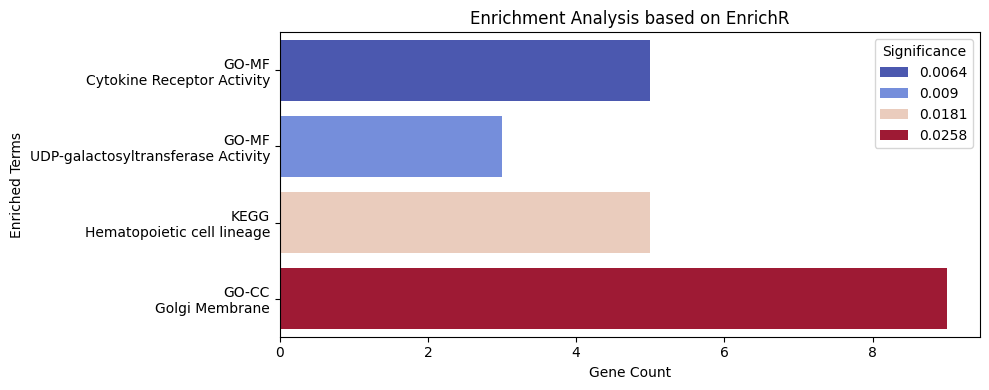

In [74]:
#Sorting the results by P-value from lowest to highest
results_sorted = results.sort_values(by='Adjusted P-value', ascending=True)
results_sorted = results_sorted[results_sorted['Adjusted P-value'] < 0.05] #Selecting the significant columns (<5%)

#Approx. to 4 decimals for better visualization
results_sorted.loc[:,'Adjusted P-value'] = results_sorted['Adjusted P-value'].round(4)

#To show the database of origin in the graph
info_to_show = {
    'GO_Biological_Process_2023': 'GO-BP',
    'GO_Cellular_Component_2023': 'GO-CC',
    'GO_Molecular_Function_2023': 'GO-MF',
    'KEGG_2021_Human': 'KEGG',
    'Reactome_Pathways_2024': 'Reactome'
}

results_sorted['Origin'] = results_sorted.apply(lambda row: f"{info_to_show.get(row['Gene_set'], '')}\n{row['Term']}", axis=1)

#Bar plot
plt.figure(figsize=(10, 4))
sns.barplot(x='Gene_count', y='Origin', data=results_sorted, palette='coolwarm', hue='Adjusted P-value')
plt.title('Enrichment Analysis based on EnrichR')
plt.xlabel('Gene Count')
plt.ylabel('Enriched Terms')
plt.legend(title='Significance', loc='best')
plt.tight_layout()
plt.show()

-----------------------------------
EXTRA CHECK for *results* dataset
-----------------------------------

Since we obtained just 4 significant Enriched Terms, we now look more in deep at them, increasing the level of significance.

In [75]:
#Separating the results based on the database
results_GO_BP = results[results['Gene_set']=='GO_Biological_Process_2023']
results_GO_MF = results[results['Gene_set']=='GO_Molecular_Function_2023']
results_GO_CC = results[results['Gene_set']=='GO_Cellular_Component_2023']
results_KEGG = results[results['Gene_set']=='KEGG_2021_Human']
results_Reactome = results[results['Gene_set']=='Reactome_Pathways_2024']

In [76]:
print(results_GO_BP.shape, "\n",
results_GO_MF.shape, "\n",
results_GO_CC.shape, "\n",
results_KEGG.shape, "\n",
results_Reactome.shape)

(656, 11) 
 (163, 11) 
 (89, 11) 
 (130, 11) 
 (268, 11)


In [77]:
significance_levels = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
all_results = [
    ('GO-BP', results_GO_BP),
    ('GO-MF', results_GO_MF),
    ('GO-CC', results_GO_CC),
    ('KEGG', results_KEGG),
    ('Reactome', results_Reactome)
]
results_extra = pd.DataFrame()

for name, df in all_results:
    c = [np.sum(df['Adjusted P-value'] < level) for level in significance_levels]
    results_extra = pd.concat([results_extra, pd.DataFrame([c], index = [name], columns=significance_levels)])

results_extra.columns = [f'Significance {j}' for j in ['5%', '10%', '15%', '20%', '25%', '30%']]
results_extra

,Significance 5%,Significance 10%,Significance 15%,Significance 20%,Significance 25%,Significance 30%
GO-BP,0,0,0,0,17,356
GO-MF,2,3,4,5,95,113
GO-CC,1,1,2,2,2,14
KEGG,1,1,2,2,2,3
Reactome,0,0,0,8,83,111


As we can see, with a level of 25% (very high) we can reach significant enriched terms from each database.

-------------------

- ### perform the enrichment analysis (via EnrichR: GO-BP, GO-MF, GO-CC, Reactome and KEGG pathways) for the original disease genes gathered at point 1.2

In [78]:
#We use the same databases as before.
#Perform enrichment analysis
enr = enrichr(gene_list=list(disease_interactome.nodes), 
              gene_sets=databases, 
              organism='human')

# Convert results to a DataFrame
results2 = enr.results
results2.columns

Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes'],
      dtype='object')

In [79]:
results2

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2023,Xenobiotic Catabolic Process (GO:0042178),4/19,5.200646e-08,0.000047,0,0,147.740741,2477.892615,GSTM4;GSTM2;GSTM1;GSTO1
1,GO_Biological_Process_2023,Cellular Response To Oxidative Stress (GO:0034...,6/117,1.149255e-07,0.000047,0,0,31.556439,504.239747,GSR;HMOX1;MAPT;SOD2;PKD2;SNCA
2,GO_Biological_Process_2023,Amyloid Fibril Formation (GO:1990000),4/24,1.415537e-07,0.000047,0,0,110.777778,1747.030545,FUS;MAPT;TARDBP;SNCA
3,GO_Biological_Process_2023,Response To Reactive Oxygen Species (GO:0000302),5/66,2.018111e-07,0.000051,0,0,46.601874,718.411385,HMOX1;APOD;MAPT;PKD2;SIRT1
4,GO_Biological_Process_2023,Negative Regulation Of Cation Channel Activity...,4/28,2.711918e-07,0.000055,0,0,92.296296,1395.560551,GSTM2;EPO;GSTO1;PKD2
...,...,...,...,...,...,...,...,...,...,...
1616,Reactome_Pathways_2024,Transcriptional Regulation by TP53,1/362,5.187415e-01,0.526126,0,0,1.392073,0.913687,GSR
1617,Reactome_Pathways_2024,Neuronal System,1/411,5.645526e-01,0.570558,0,0,1.222639,0.699009,MAPT
1618,Reactome_Pathways_2024,Diseases of Signal Transduction by Growth Fact...,1/451,5.987716e-01,0.603003,0,0,1.111681,0.570153,PSEN1
1619,Reactome_Pathways_2024,Sensory Perception,1/640,7.280712e-01,0.730635,0,0,0.775290,0.246043,SPTAN1


In [80]:
#Remove the parts of "(GO:..etc...)" in 'Term' column
results2['Term'] = results2['Term'].apply(remove_in_Term)

#Extract the number of genes
results2['Gene_count'] = results2['Genes'].apply(genes_count)
results2

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Gene_count
0,GO_Biological_Process_2023,Xenobiotic Catabolic Process,4/19,5.200646e-08,0.000047,0,0,147.740741,2477.892615,GSTM4;GSTM2;GSTM1;GSTO1,4
1,GO_Biological_Process_2023,Cellular Response To Oxidative Stress,6/117,1.149255e-07,0.000047,0,0,31.556439,504.239747,GSR;HMOX1;MAPT;SOD2;PKD2;SNCA,6
2,GO_Biological_Process_2023,Amyloid Fibril Formation,4/24,1.415537e-07,0.000047,0,0,110.777778,1747.030545,FUS;MAPT;TARDBP;SNCA,4
3,GO_Biological_Process_2023,Response To Reactive Oxygen Species,5/66,2.018111e-07,0.000051,0,0,46.601874,718.411385,HMOX1;APOD;MAPT;PKD2;SIRT1,5
4,GO_Biological_Process_2023,Negative Regulation Of Cation Channel Activity,4/28,2.711918e-07,0.000055,0,0,92.296296,1395.560551,GSTM2;EPO;GSTO1;PKD2,4
...,...,...,...,...,...,...,...,...,...,...,...
1616,Reactome_Pathways_2024,Transcriptional Regulation by TP53,1/362,5.187415e-01,0.526126,0,0,1.392073,0.913687,GSR,1
1617,Reactome_Pathways_2024,Neuronal System,1/411,5.645526e-01,0.570558,0,0,1.222639,0.699009,MAPT,1
1618,Reactome_Pathways_2024,Diseases of Signal Transduction by Growth Fact...,1/451,5.987716e-01,0.603003,0,0,1.111681,0.570153,PSEN1,1
1619,Reactome_Pathways_2024,Sensory Perception,1/640,7.280712e-01,0.730635,0,0,0.775290,0.246043,SPTAN1,1


In [81]:
#Separating the results based on the database
results2_GO_BP = results2[results2['Gene_set']=='GO_Biological_Process_2023']
results2_GO_MF = results2[results2['Gene_set']=='GO_Molecular_Function_2023']
results2_GO_CC = results2[results2['Gene_set']=='GO_Cellular_Component_2023']
results2_KEGG = results2[results2['Gene_set']=='KEGG_2021_Human']
results2_Reactome = results2[results2['Gene_set']=='Reactome_Pathways_2024']

In [82]:
print(results2_GO_BP.shape, "\n",
results2_GO_MF.shape, "\n",
results2_GO_CC.shape, "\n",
results2_KEGG.shape, "\n",
results2_Reactome.shape)

(1005, 11) 
 (132, 11) 
 (101, 11) 
 (98, 11) 
 (285, 11)


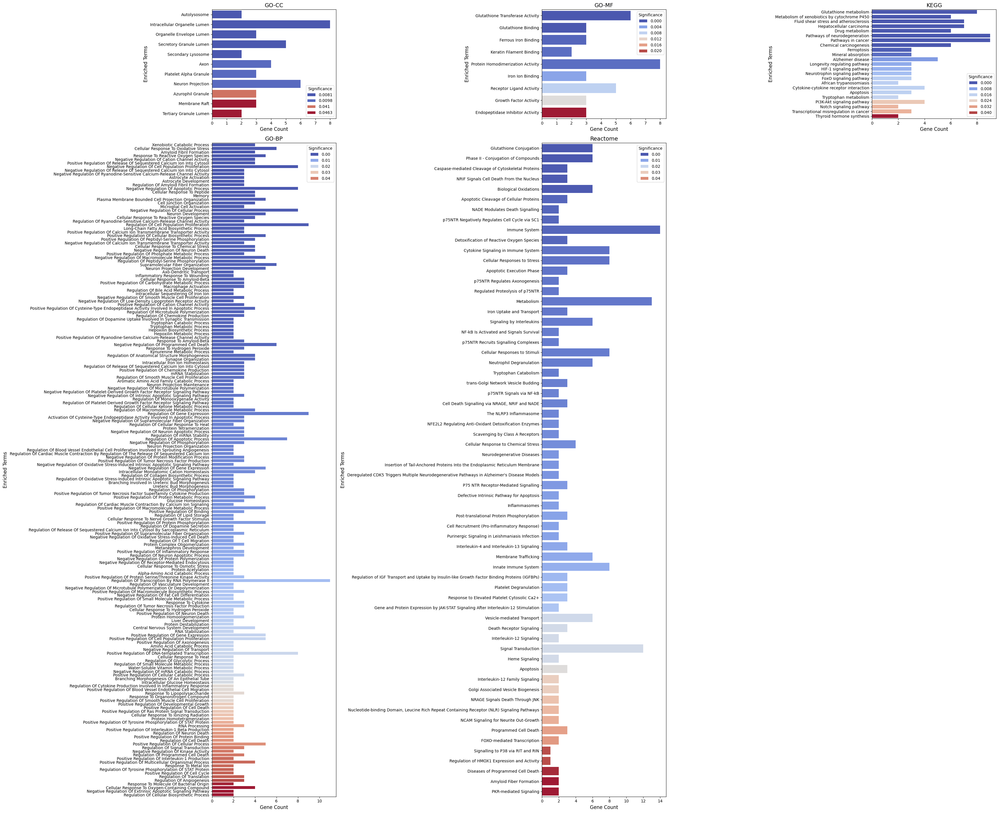

In [83]:
#Separated images for each database
#Dataset with all the databases
datasets = [
    ('GO-CC', results2_GO_CC),
    ('GO-MF', results2_GO_MF),
    ('KEGG', results2_KEGG),
    ('GO-BP', results2_GO_BP),
    ('Reactome', results2_Reactome)
]

#Plot
fig, axes = plt.subplots(
    2, 3, figsize=(35, 30), 
    gridspec_kw={'height_ratios': [0.5, 3]}  #Second row is higher than the first one (proportion of 0.5:3)
)

#Subplot
for ax, (db_i, db_res) in zip(axes.flat, datasets):
    #Sorting and filtering results
    db_res_sorted = db_res.sort_values(by='Adjusted P-value', ascending=True)
    #Only significant values (<5%)
    db_res_sorted = db_res_sorted[db_res_sorted['Adjusted P-value'] < 0.05]

    #Approx. to 4 decimals for better visualization
    db_res_sorted['Adjusted P-value'] = db_res_sorted['Adjusted P-value'].round(4)
    
    #Check if there are enough data for the graph
    if not db_res_sorted.empty:
        sns.barplot(x='Gene_count', y='Term', data=db_res_sorted, palette='coolwarm', hue='Adjusted P-value', ax=ax)
        ax.set_title(db_i, fontsize=14)
        ax.set_xlabel('Gene Count', fontsize=12)
        ax.set_ylabel('Enriched Terms', fontsize=12)
        ax.legend(title='Significance', loc='best', fontsize=10, title_fontsize=10)
        ax.tick_params(axis='y', labelsize=10)
    else:
        ax.set_title(db_i, fontsize=14)
        ax.text(0.5, 0.5, 'No significant results', ha='center', va='center', fontsize=12)
        ax.axis('off')

#Hiding the last subplot since it is not present
if len(datasets) < 6:
    axes[-1, -1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

- ### evaluate the overlap (if any) between enriched functions (i.e. terms associated with adjusted p-value<0.05) of original disease genes and putative disease genes.

In [131]:
#Only the significant ones
significant_putative_diffusion = results[results['Adjusted P-value'] < 0.05]
significant_original = results2[results2['Adjusted P-value'] < 0.05]

significant_putative_diffusion = list(significant_putative_diffusion['Term']) 
significant_original = list(significant_original['Term'])

#Overlap of unique values
overlap = list(set(significant_putative_diffusion) & set(significant_original))

if not overlap:
    print("There are no genes overlapping within the putative from Diffusion and the original ones.")
else:
    print(f"There are {len(overlap)} and the overlapping terms are: {overlap}")

There are no genes overlapping within the putative from Diffusion and the original ones.


In [100]:
significant_putative_diffusion

['Golgi Membrane',
 'Cytokine Receptor Activity',
 'UDP-galactosyltransferase Activity',
 'Hematopoietic cell lineage']

In [88]:
significant_original

['Xenobiotic Catabolic Process',
 'Cellular Response To Oxidative Stress',
 'Amyloid Fibril Formation',
 'Response To Reactive Oxygen Species',
 'Negative Regulation Of Cation Channel Activity',
 'Positive Regulation Of Release Of Sequestered Calcium Ion Into Cytosol',
 'Negative Regulation Of Cell Population Proliferation',
 'Negative Regulation Of Release Of Sequestered Calcium Ion Into Cytosol',
 'Negative Regulation Of Ryanodine-Sensitive Calcium-Release Channel Activity',
 'Astrocyte Activation',
 'Astrocyte Development',
 'Regulation Of Amyloid Fibril Formation',
 'Negative Regulation Of Apoptotic Process',
 'Cellular Response To Peptide',
 'Memory',
 'Plasma Membrane Bounded Cell Projection Organization',
 'Cell Junction Organization',
 'Microglial Cell Activation',
 'Negative Regulation Of Cellular Process',
 'Neuron Development',
 'Cellular Response To Reactive Oxygen Species',
 'Regulation Of Ryanodine-Sensitive Calcium-Release Channel Activity',
 'Regulation Of Cell Populati

-----------------------------------
EXTRA CHECK with DIAMOnD and DiaBLE
-----------------------------------

In [89]:
#Perform enrichment analysis for DIAMOnD
putative_diamond = list(diamond_df['Gene'])

enr = enrichr(gene_list=putative_diamond,
              gene_sets=databases,
              organism='human')

# Convert results to a DataFrame
results_diamond = enr.results
results_diamond.columns

Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes'],
      dtype='object')

In [90]:
#Remove the parts of "(GO:..etc...)" in 'Term' column
results_diamond['Term'] = results_diamond['Term'].apply(remove_in_Term)

#Extract the number of genes
results_diamond['Gene_count'] = results_diamond['Genes'].apply(genes_count)
results_diamond

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Gene_count
0,GO_Biological_Process_2023,Regulation Of Apoptotic Process,23/705,5.203784e-13,6.921033e-10,0,0,8.417070,238.070253,HSPA9;VCP;HSP90AA1;NPM1;HSPA5;STAT1;HSPB1;PARK...,23
1,GO_Biological_Process_2023,Protein Stabilization,12/208,5.486911e-10,3.038267e-07,0,0,13.708720,292.317690,CCT2;PINK1;HSP90AA1;HSP90AB1;PIH1D1;CDC37;FLNA...,12
2,GO_Biological_Process_2023,Chaperone-Mediated Protein Complex Assembly,6/21,6.853233e-10,3.038267e-07,0,0,84.617021,1785.514799,CCT2;HSP90AA1;HSP90AB1;HSPA4;HSPD1;HSPA1A,6
3,GO_Biological_Process_2023,Response To Unfolded Protein,7/44,2.078922e-09,6.912417e-07,0,0,40.407149,807.796133,HSPA8;HSP90AA1;HSP90AB1;HSPA4;HSPB1;HSPD1;HSPA1A,7
4,GO_Biological_Process_2023,Pyruvate Metabolic Process,7/50,5.288019e-09,1.287642e-06,0,0,34.758440,662.420162,LDHB;LDHA;TPI1;PKM;PGK1;ENO1;GAPDH,7
...,...,...,...,...,...,...,...,...,...,...,...
2550,Reactome_Pathways_2024,Sensory Perception,2/640,8.341417e-01,8.386445e-01,0,0,0.616147,0.111740,MSN;ACTB,2
2551,Reactome_Pathways_2024,Neuronal System,1/411,8.752706e-01,8.788094e-01,0,0,0.480168,0.063969,HSPA8,1
2552,Reactome_Pathways_2024,GPCR Downstream Signalling,1/633,9.602140e-01,9.627987e-01,0,0,0.307953,0.012503,FN1,1
2553,Reactome_Pathways_2024,Signaling by GPCR,1/706,9.727534e-01,9.740608e-01,0,0,0.275020,0.007597,FN1,1


In [91]:
#Perform enrichment analysis for DiaBLE
putative_diable = list(df_diable['Gene'])

enr = enrichr(gene_list=putative_diable,
              gene_sets=databases,
              organism='human')

# Convert results to a DataFrame
results_diable = enr.results
results_diable.columns

Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes'],
      dtype='object')

In [92]:
#Remove the parts of "(GO:..etc...)" in 'Term' column
results_diable['Term'] = results_diable['Term'].apply(remove_in_Term)

#Extract the number of genes
results_diable['Gene_count'] = results_diable['Genes'].apply(genes_count)
results_diable

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Gene_count
0,GO_Biological_Process_2023,Regulation Of I-kappaB kinase/NF-kappaB Signaling,50/232,3.770345e-71,5.165373e-68,0,0,108.340659,17568.128596,TRAF3IP2;TRADD;TNFAIP3;HSPB1;TNF;IKBKB;TBK1;CA...,50
1,GO_Biological_Process_2023,Positive Regulation Of I-kappaB kinase/NF-kapp...,41/175,3.615129e-59,2.476363e-56,0,0,102.505186,13793.855640,RNF31;TRAF3IP2;TRADD;NOD1;NOD2;BCL10;TNF;MALT1...,41
2,GO_Biological_Process_2023,Positive Regulation Of Intracellular Signal Tr...,45/525,1.804004e-44,8.238286e-42,0,0,33.102273,3334.184556,RNF31;BECN1;HSP90AB1;TRAF3IP2;TRADD;NOD1;NOD2;...,45
3,GO_Biological_Process_2023,Positive Regulation Of DNA-binding Transcripti...,29/246,4.331247e-32,1.483452e-29,0,0,37.048549,2675.530178,RNF31;TRADD;NOD1;NOD2;BCL10;TNF;MALT1;IKBKB;IR...,29
4,GO_Biological_Process_2023,Positive Regulation Of NF-kappaB Transcription...,25/152,2.010077e-31,5.507612e-29,0,0,51.897638,3668.227005,RNF31;TRADD;NOD1;NOD2;BCL10;TNF;MALT1;IKBKB;IR...,25
...,...,...,...,...,...,...,...,...,...,...,...
2499,Reactome_Pathways_2024,MAPK Family Signaling Cascades,1/314,7.953411e-01,7.998794e-01,0,0,0.632104,0.144742,UBC,1
2500,Reactome_Pathways_2024,Hemostasis,2/707,8.730608e-01,8.767919e-01,0,0,0.555652,0.075430,AKT1;YWHAZ,2
2501,Reactome_Pathways_2024,GPCR Downstream Signalling,1/633,9.602140e-01,9.629457e-01,0,0,0.307953,0.012503,AKT1,1
2502,Reactome_Pathways_2024,Metabolism,6/2181,9.680910e-01,9.694661e-01,0,0,0.520176,0.016869,GSTM3;HSP90AA1;HSP90AB1;MDH1;UBC;AKT1,6


In [93]:
print("Number of significant Terms from DIAMOnD: ", np.sum(results_diamond['Adjusted P-value'] < 0.05))
print("Number of significant Terms from DiaBLE: ", np.sum(results_diable['Adjusted P-value'] < 0.05))

Number of significant Terms from DIAMOnD:  612
Number of significant Terms from DiaBLE:  1035


In [157]:
#For DIAMOnD
#Separating the results based on the database
diamond_GO_BP = results_diamond[results_diamond['Gene_set']=='GO_Biological_Process_2023']
diamond_GO_MF = results_diamond[results_diamond['Gene_set']=='GO_Molecular_Function_2023']
diamond_GO_CC = results_diamond[results_diamond['Gene_set']=='GO_Cellular_Component_2023']
diamond_KEGG = results_diamond[results_diamond['Gene_set']=='KEGG_2021_Human']
diamond_Reactome = results_diamond[results_diamond['Gene_set']=='Reactome_Pathways_2024']

datasets_diamond = [
    ('GO-BP', diamond_GO_BP),
    ('GO-MF', diamond_GO_MF),
    ('GO-CC', diamond_GO_CC),
    ('KEGG', diamond_KEGG),
    ('Reactome', diamond_Reactome)
]
diamond_extra = pd.DataFrame()

for name, df in datasets_diamond:
    c = [np.sum(df['Adjusted P-value'] < 0.05)]
    diamond_extra = pd.concat([diamond_extra, pd.DataFrame([c], index = [name], columns=['5% DIAMOnD'])])

In [158]:
#For DiaBLE
#Separating the results based on the database
diable_GO_BP = results_diable[results_diable['Gene_set']=='GO_Biological_Process_2023']
diable_GO_MF = results_diable[results_diable['Gene_set']=='GO_Molecular_Function_2023']
diable_GO_CC = results_diable[results_diable['Gene_set']=='GO_Cellular_Component_2023']
diable_KEGG = results_diable[results_diable['Gene_set']=='KEGG_2021_Human']
diable_Reactome = results_diable[results_diable['Gene_set']=='Reactome_Pathways_2024']

datasets_diable = [
    ('GO-BP', diable_GO_BP),
    ('GO-MF', diable_GO_MF),
    ('GO-CC', diable_GO_CC),
    ('KEGG', diable_KEGG),
    ('Reactome', diable_Reactome)
]
diable_extra = pd.DataFrame()

for name, df in datasets_diable:
    c = [np.sum(df['Adjusted P-value'] < 0.05)]
    diable_extra = pd.concat([diable_extra, pd.DataFrame([c], index = [name], columns=['5% DiaBLE'])])

In [159]:
all_extra = pd.concat([diamond_extra, diable_extra], axis=1)
all_extra

,5% DIAMOnD,5% DiaBLE
GO-BP,257,516
GO-MF,60,75
GO-CC,16,25
KEGG,54,100
Reactome,225,319


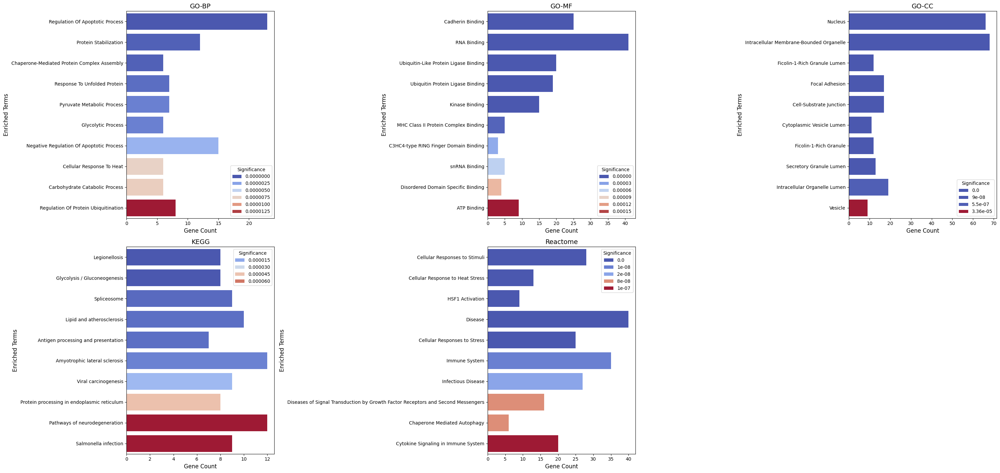

In [ ]:
#Separated plots for each database for DIAMOnD
fig, axes = plt.subplots(2, 3, figsize=(30, 15))

#Subplot
for ax, (db_i, db_res) in zip(axes.flat, datasets_diamond):
    #Sorting and filtering results
    db_res_sorted = db_res.sort_values(by='Adjusted P-value', ascending=True)
    #Only significant values (<5%)
    db_res_sorted = db_res_sorted[db_res_sorted['Adjusted P-value'] < 0.05]

    #Approx. to 4 decimals for better visualization
    db_res_sorted['Adjusted P-value'] = db_res_sorted['Adjusted P-value'].round(8)

    #We take just the first 10 rows
    db_res_sorted = db_res_sorted.head(10)
    
    #Check if there are enough data for the graph
    if not db_res_sorted.empty:
        sns.barplot(x='Gene_count', y='Term', data=db_res_sorted, palette='coolwarm', hue='Adjusted P-value', ax=ax)
        ax.set_title(db_i, fontsize=14)
        ax.set_xlabel('Gene Count', fontsize=12)
        ax.set_ylabel('Enriched Terms', fontsize=12)
        ax.legend(title='Significance', loc='best', fontsize=10, title_fontsize=10)
        ax.tick_params(axis='y', labelsize=10)
    else:
        ax.set_title(db_i, fontsize=14)
        ax.text(0.5, 0.5, 'No significant results', ha='center', va='center', fontsize=12)
        ax.axis('off')

#Hiding the last subplot since it is not present
if len(datasets) < 6:
    axes[-1, -1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

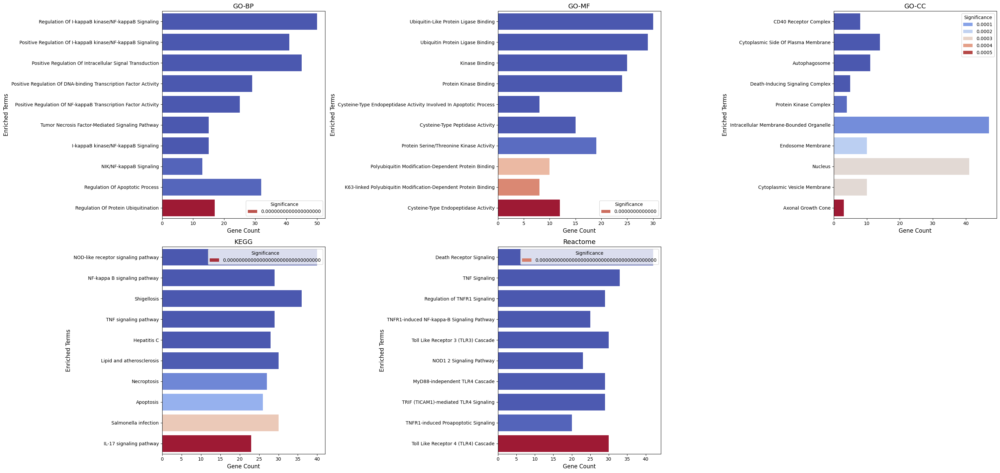

In [161]:
#Separated plots for each database for DiaBLE
fig, axes = plt.subplots(2, 3, figsize=(30, 15))

#Subplot
for ax, (db_i, db_res) in zip(axes.flat, datasets_diable):
    #Sorting and filtering results
    db_res_sorted = db_res.sort_values(by='Adjusted P-value', ascending=True)
    #Only significant values (<5%)
    db_res_sorted = db_res_sorted[db_res_sorted['Adjusted P-value'] < 0.05]

    #Approx. to 4 decimals for better visualization --> no need cause the significance here is very low
    #db_res_sorted['Adjusted P-value'] = db_res_sorted['Adjusted P-value'].round(10)

    #We take just the first 10 rows
    db_res_sorted = db_res_sorted.head(10)
    
    #Check if there are enough data for the graph
    if not db_res_sorted.empty:
        sns.barplot(x='Gene_count', y='Term', data=db_res_sorted, palette='coolwarm', hue='Adjusted P-value', ax=ax)
        ax.set_title(db_i, fontsize=14)
        ax.set_xlabel('Gene Count', fontsize=12)
        ax.set_ylabel('Enriched Terms', fontsize=12)
        ax.legend(title='Significance', loc='best', fontsize=10, title_fontsize=10)
        ax.tick_params(axis='y', labelsize=10)
    else:
        ax.set_title(db_i, fontsize=14)
        ax.text(0.5, 0.5, 'No significant results', ha='center', va='center', fontsize=12)
        ax.axis('off')

#Hiding the last subplot since it is not present
if len(datasets) < 6:
    axes[-1, -1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Now we see if there is any overlap between the Enriched Terms of the putative genes from DIAMOnD and the original ones.

In [129]:
#Only the significant ones
significant_putative_diamond = results_diamond[results_diamond['Adjusted P-value'] < 0.05]
significant_putative_diamond = list(significant_putative_diamond['Term']) 

#Overlap of unique values
overlap2 = list(set(significant_putative_diamond) & set(significant_original))

if not overlap2:
    print("There are no genes overlapping within the putative from DIAMOnD and the original ones.")
else:
    print(f"There are {len(overlap2)} and the overlapping terms are: {overlap2}")

There are 75 and the overlapping terms are: ['Negative Regulation Of Cellular Process', 'Cell Death Signalling via NRAGE, NRIF and NADE', 'Pathways in cancer', 'Negative Regulation Of Oxidative Stress-Induced Cell Death', 'Positive Regulation Of Gene Expression', 'Immune System', 'NADE Modulates Death Signalling', 'Secretory Granule Lumen', 'Negative Regulation Of Oxidative Stress-Induced Intrinsic Apoptotic Signaling Pathway', 'Signal Transduction', 'Cellular Responses to Stress', 'Neurodegenerative Diseases', 'Positive Regulation Of Macromolecule Biosynthetic Process', 'Apoptotic Cleavage of Cellular Proteins', 'Gene and Protein Expression by JAK-STAT Signaling After Interleukin-12 Stimulation', 'Regulation Of Programmed Cell Death', 'Regulation Of Transcription By RNA Polymerase II', 'FOXO-mediated Transcription', 'Regulation Of Cell Population Proliferation', 'Response to Elevated Platelet Cytosolic Ca2+', 'Negative Regulation Of Intrinsic Apoptotic Signaling Pathway', 'Pathways of

Now we see if there is any overlap between the Enriched Terms of the putative genes from DiaBLE and the original ones.

In [130]:
#Only the significant ones
significant_putative_diable = results_diable[results_diable['Adjusted P-value'] < 0.05]
significant_putative_diable = list(significant_putative_diable['Term']) 

#Overlap of unique values
overlap3 = list(set(significant_putative_diable) & set(significant_original))

if not overlap3:
    print("There are no genes overlapping within the putative from DiaBLE and the original ones.")
else:
    print(f"There are {len(overlap3)} and the overlapping terms are: {overlap3}")

There are 110 and the overlapping terms are: ['Inflammasomes', 'Autolysosome', 'Negative Regulation Of Oxidative Stress-Induced Intrinsic Apoptotic Signaling Pathway', 'Positive Regulation Of Cellular Catabolic Process', 'NF-kB Is Activated and Signals Survival', 'Vesicle-mediated Transport', 'Negative Regulation Of Programmed Cell Death', 'p75NTR Signals via NF-kB', 'Regulation Of Cellular Response To Heat', 'Positive Regulation Of Tumor Necrosis Factor Production', 'Regulation Of Tumor Necrosis Factor Production', 'Membrane Trafficking', 'Cellular Response to Chemical Stress', 'Negative Regulation Of Apoptotic Process', 'Cellular Response To Hydrogen Peroxide', 'Cellular Responses to Stimuli', 'Diseases of Programmed Cell Death', 'Cellular Response To Reactive Oxygen Species', 'The NLRP3 Inflammasome', 'Ferroptosis', 'Positive Regulation Of DNA-templated Transcription', 'Cellular Response To Oxygen-Containing Compound', 'Positive Regulation Of Neuron Death', 'Chemical carcinogenesis'

----------

## 4. Drug repurposing

### 4.1 Drug identification
- ### Select the first 20 putative disease genes in the ranking obtained at point 3.1
- ### Use DGIdb (dgidb.org) latest “interactions.tsv” file to associate such 20 genes (column “gene_name”) to approved drugs (column “drug_name”, column “approved”=True) (access the db file manually or via API at your own convenience).
- ### Compile a ranking of identified drugs, starting with the drug associated with the most of the above 20 genes, moving downward.

First we import the drug-gene interactions file downloaded from DGIdb.

In [109]:
interactions = pd.read_csv("interactions.tsv", sep = "\t", header = 0, low_memory=False)
interactions

,gene_claim_name,gene_concept_id,gene_name,interaction_source_db_name,interaction_source_db_version,interaction_type,interaction_score,drug_claim_name,drug_concept_id,drug_name,approved,immunotherapy,anti_neoplastic
0,CYP2D6,hgnc:2625,CYP2D6,DTC,9/2/20,NaN,0.017709,RACLOPRIDE,ncit:C152139,RACLOPRIDE,False,False,False
1,PPARG,hgnc:9236,PPARG,DTC,9/2/20,NaN,0.840123,KALOPANAX-SAPONIN F,chembl:CHEMBL1833984,CHEMBL:CHEMBL1833984,False,False,False
2,ATAD5,hgnc:25752,ATAD5,DTC,9/2/20,NaN,0.177992,RO-5-3335,chembl:CHEMBL91609,CHEMBL:CHEMBL91609,False,False,False
3,RGS4,hgnc:10000,RGS4,DTC,9/2/20,NaN,0.034319,"3,4-DICHLOROISOCOUMARIN",drugbank:DB04459,"3,4-DICHLOROISOCOUMARIN",False,False,False
4,MAPK1,hgnc:6871,MAPK1,DTC,9/2/20,NaN,0.050007,WITHAFERIN A,iuphar.ligand:13097,WITHAFERIN A,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
98234,TP53,hgnc:11998,TP53,JAX-CKB,10-Apr-24,NaN,0.014489,PD-0325901,ncit:C52195,MIRDAMETINIB,False,False,True
98235,TP53,hgnc:11998,TP53,JAX-CKB,10-Apr-24,NaN,0.115911,ALRN-6924,ncit:C118669,SULANEMADLIN,False,False,False
98236,TP53,hgnc:11998,TP53,JAX-CKB,10-Apr-24,NaN,0.025758,LY3009120,iuphar.ligand:8943,LY3009120,False,False,False
98237,TP53,hgnc:11998,TP53,JAX-CKB,10-Apr-24,NaN,0.010537,Cabozantinib,rxcui:1363267,CABOZANTINIB S-MALATE,True,False,True


Then we check the correctedness of the top 20 putative genes symbols. The list of gene symbols was provided to the BioMart tool from HGNC  https://biomart.genenames.org/martform/#!/default/HGNC?datasets=hgnc_gene_mart_2024_12_06 (using Gene Mart) and the resulting .txt file was downloaded.

In [175]:
#Extracting diable algorithm top 20 genes
top20_genes = list(df_diable["Gene"][0:20])
print(top20_genes)

['MDH1', 'GSTM3', 'SQSTM1', 'PINK1', 'MAP1LC3B', 'HSPB1', 'EEF2', 'CASP3', 'CASP7', 'CASP6', 'CASP8', 'CASP9', 'XIAP', 'CASP10', 'CASP2', 'TRAF6', 'CASP4', 'NOD1', 'BIRC2', 'RIPK2']


In [111]:
#We save the unique genes ino a text file to verify their names in HGNC
genes_string = ",".join(top20_genes)
with open(f'top20_genes_list.txt', 'w') as f:
    f.write(genes_string)

In [112]:
hgnc_20 = pd.read_csv("hgnc-top20-symbols.txt", sep="\t", header = 0)
hgnc_20

,HGNC ID,Status,Approved symbol,Approved name,Alias symbol,Alias name
0,HGNC:4635,Approved,GSTM3,glutathione S-transferase mu 3,GST5,NaN
1,HGNC:4635,Approved,GSTM3,glutathione S-transferase mu 3,GSTM3TV2,NaN
2,HGNC:5246,Approved,HSPB1,heat shock protein family B (small) member 1,HSP27,NaN
3,HGNC:5246,Approved,HSPB1,heat shock protein family B (small) member 1,HSP28,NaN
4,HGNC:5246,Approved,HSPB1,heat shock protein family B (small) member 1,Hs.76067,NaN
...,...,...,...,...,...,...
57,HGNC:11280,Approved,SQSTM1,sequestosome 1,A170,autophagy receptor p62
58,HGNC:12036,Approved,TRAF6,TNF receptor associated factor 6,RNF85,RING finger protein 85
59,HGNC:592,Approved,XIAP,X-linked inhibitor of apoptosis,hILP,IAP-like protein 1
60,HGNC:592,Approved,XIAP,X-linked inhibitor of apoptosis,ILP-1,IAP-like protein 1


In [113]:
#Approved-alias dictionary
approved_alias_20 = fetch_hgnc(hgnc_20)
#Check correctness of gene names in interactions.tsv
interactions, substitutions_2 = correct_gene_symbols(interactions, "gene_name", approved_alias_20)

Gene CYP2D6 not found in approved genes or aliases.
Gene PPARG not found in approved genes or aliases.
Gene ATAD5 not found in approved genes or aliases.
Gene RGS4 not found in approved genes or aliases.
Gene MAPK1 not found in approved genes or aliases.
Gene AGTR1 not found in approved genes or aliases.
Gene KDR not found in approved genes or aliases.
Gene PARP1 not found in approved genes or aliases.
Gene NUDT2 not found in approved genes or aliases.
Gene DTNB not found in approved genes or aliases.
Gene F10 not found in approved genes or aliases.
Gene RYR3 not found in approved genes or aliases.
Gene KIT not found in approved genes or aliases.
Gene CCL4 not found in approved genes or aliases.
Gene CSF2 not found in approved genes or aliases.
Gene BAZ2B not found in approved genes or aliases.
Gene JUN not found in approved genes or aliases.
Gene EHMT2 not found in approved genes or aliases.
Gene CSNK2A3 not found in approved genes or aliases.
Gene ADRB1 not found in approved genes or

We write a function that identifies and ranks drugs based on their interactions with the top 20 genes from a given gene list.

In [114]:
def drug_indetification_ranking_1(GeneList, InteractionsDF):
    top_genes = GeneList["Gene"][0:20]
    
    #Filt dataframe keeping only approved drugs for the 20 top genes identified with the best performing algorithm
    filtered_df = InteractionsDF[(InteractionsDF["gene_name"].isin(top_genes)) & (InteractionsDF["approved"] == True)]
    filtered_df = filtered_df[["gene_name", "drug_name"]]
    
    #Group the dataframe based on the drug and create a list genes accociated with the drug 
    drug_ranking = filtered_df.groupby("drug_name")["gene_name"].apply(list).reset_index()
    
    #Count with how many top genes each drug interacts
    drug_ranking["GeneCount"] = drug_ranking["gene_name"].apply(len)
    
    #Sort drugs based on the number of interactions (decreasing)
    drug_ranking = drug_ranking.sort_values(by="GeneCount", ascending=False).reset_index(drop=True)
    
    return filtered_df, drug_ranking

In [115]:
filtered_df, drug_ranking = drug_indetification_ranking_1(df_diable, interactions)
drug_ranking

,drug_name,gene_name,GeneCount
0,DOXORUBICIN HYDROCHLORIDE,"[XIAP, CASP3, GSTM3]",3
1,CISPLATIN,"[XIAP, CASP3]",2
2,EMAPALUMAB-LZSG,"[XIAP, XIAP]",2
3,CELECOXIB,"[CASP9, CASP3]",2
4,CLADRIBINE,"[XIAP, XIAP]",2
5,ABALOPARATIDE,[XIAP],1
6,METHYLDOPA ANHYDROUS,[CASP6],1
7,METHYLERGONOVINE MALEATE,[CASP6],1
8,METHYSERGIDE MALEATE,[CASP6],1
9,MOMETASONE,[HSPB1],1


As we can see the top interacting drugs always interact with the same genes. That's because the same drug-gene interaction can be reported multiple times because of different interaction mechanisms or because of data from different sources/works or different database’s versions. But this make conjuring the Clinical Trials validation analysis. Here there is the example of the first ranked drug Brompheniramine.

In [116]:
interactions[interactions["drug_name"] == "BROMPHENIRAMINE"]

,gene_claim_name,gene_concept_id,gene_name,interaction_source_db_name,interaction_source_db_version,interaction_type,interaction_score,drug_claim_name,drug_concept_id,drug_name,approved,immunotherapy,anti_neoplastic
8515,UNIPROT:P35367,hgnc:5182,HRH1,TdgClinicalTrial,Jan-14,NaN,0.635173,DEXBROMPHENIRAMINE,rxcui:1767,BROMPHENIRAMINE,True,False,False
8531,UNIPROT:P35367,hgnc:5182,HRH1,TEND,1-Aug-11,NaN,0.635173,BROMPHENIRAMINE,rxcui:1767,BROMPHENIRAMINE,True,False,False
37082,HISTAMINE H1 RECEPTOR,hgnc:5182,HRH1,TTD,2020.06.01,NaN,0.635173,Dexbrompheniramine,rxcui:1767,BROMPHENIRAMINE,True,False,False
64202,UNIPROT:P35367,hgnc:5182,HRH1,TdgClinicalTrial,Jan-14,NaN,0.635173,BROMPHENIRAMINE,rxcui:1767,BROMPHENIRAMINE,True,False,False
74536,EHMT2,hgnc:14129,EHMT2,DTC,9/2/20,NaN,0.030635,DEXBROMPHENIRAMINE,rxcui:1767,BROMPHENIRAMINE,True,False,False
85931,HISTAMINE H1 RECEPTOR,hgnc:5182,HRH1,TTD,2020.06.01,NaN,0.635173,Brompheniramine,rxcui:1767,BROMPHENIRAMINE,True,False,False
90347,UNIPROT:P35367,hgnc:5182,HRH1,TEND,1-Aug-11,NaN,0.635173,DEXBROMPHENIRAMINE,rxcui:1767,BROMPHENIRAMINE,True,False,False


So we wrote a second function to just keep, for each drug-gene combination,  only the instances where the identified interaction types are distinct, if multiple entries are present.

In [117]:
def drug_indetification_ranking_2(GeneList, InteractionsDF):
    top_genes = GeneList["Gene"][0:20]

    #Filt dataframe keeping only approved drugs for the 20 top genes identified with the best performing algorithm
    filtered_df = InteractionsDF[(InteractionsDF["gene_name"].isin(top_genes)) & (InteractionsDF["approved"] == True)]

    #Manage multiple interactions keeping only non NaN
    def filter_interactions(group):
        if group["interaction_type"].notna().any():
            return group[group["interaction_type"].notna()]
        else:
            return group.iloc[[0]]

    #Apply function to drug-gene combinations
    filtered_df = (filtered_df.groupby(["gene_name", "drug_name"], group_keys=False).apply(filter_interactions))

    #Group the dataframe based on the drug and create a list genes accociated with the drug
    drug_ranking = filtered_df.groupby("drug_name")["gene_name"].apply(list).reset_index()
    
    #Count with how many top genes each drug interact
    drug_ranking["GeneCount"] = drug_ranking["gene_name"].apply(len)
   

    #Sort drugs based on the number of interactions (decreasing)
    drug_ranking = drug_ranking.sort_values(by="GeneCount", ascending=False).reset_index(drop=True)

    return filtered_df, drug_ranking

In [118]:
filtered_df_2, drug_ranking_2 = drug_indetification_ranking_2(df_diable, interactions)
drug_ranking_2

C:\Users\sofyc\AppData\Local\Temp\ipykernel_19988\3508006811.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  filtered_df = (filtered_df.groupby(["gene_name", "drug_name"], group_keys=False).apply(filter_interactions))


,drug_name,gene_name,GeneCount
0,DOXORUBICIN HYDROCHLORIDE,"[CASP3, GSTM3, XIAP]",3
1,CISPLATIN,"[CASP3, XIAP]",2
2,CELECOXIB,"[CASP3, CASP9]",2
3,ABALOPARATIDE,[XIAP],1
4,IMATINIB,[XIAP],1
5,METHYLDOPA ANHYDROUS,[CASP6],1
6,METHYLERGONOVINE MALEATE,[CASP6],1
7,METHYSERGIDE MALEATE,[CASP6],1
8,MOMETASONE,[HSPB1],1
9,MOXETUMOMAB PASUDOTOX,[EEF2],1


### 4.2 Clinical Trials validation
- ### Take the first three drugs and for each of them taken individually check on https://clinicaltrials.gov if there are clinical trials testing the drug (search field: “other terms”) for the disease of interest (search field: “condition or disease”) and note the number of clinical trials, optionally reporting the title and ID (NTC…) of one of them that cites drug name and disease name.

## OPTIONAL TASK
### Run PROCONSUL (temp=1) and compare top 20 genes with top 20 from the best performer algorithm chosen at point 3.1.

The linked github repository was cloned with the following codes in the command line: \
**Personal repository path in personal laptop** \
**git clone https://github.com/rickydeluca/PROCONSUL**

In [134]:
# Path to the PROCONSUL repository
proconsul_path = Path("PROCONSUL")

# Add the PROCONSUL repository to Python's module search path
sys.path.append(str(proconsul_path))

In [138]:
import proconsul

For Windows PC: see the rest of the code in Colab.

In [176]:
#Load the file
proconsul_df = pd.read_csv("output_proconsul.txt", sep = '\t', low_memory=False)

In [177]:
proconsul_df

,rank,node,rank_score
0,1,SQSTM1,96.0
1,2,MAP1LC3B,90.8
2,3,GSTM3,90.0
3,4,EEF2,89.5
4,5,HSPB1,87.5
...,...,...,...
95,96,RPA1,15.9
96,97,ACLY,15.4
97,98,ACO2,15.2
98,99,PAICS,15.1


In [ ]:
#We take just the top 20 genes to compare them with top 20 from DiaBLE (best performer algorithm)
proconsul_df_top = proconsul_df.head(20)
proconsul_df_top

,rank,node,rank_score
0,1,SQSTM1,96.0
1,2,MAP1LC3B,90.8
2,3,GSTM3,90.0
3,4,EEF2,89.5
4,5,HSPB1,87.5
5,6,PINK1,84.6
6,7,HSPA8,82.7
7,8,VCP,80.2
8,9,LDHA,79.2
9,10,CASP3,76.9


In [ ]:
#We take the top 20 from DiaBLE
df_diable_top = pd.read_csv("top20_genes_list.txt", sep = ',', low_memory=False)
df_diable_top

,MDH1,GSTM3,SQSTM1,PINK1,MAP1LC3B,HSPB1,EEF2,CASP3,CASP7,CASP6,CASP8,CASP9,XIAP,CASP10,CASP2,TRAF6,CASP4,NOD1,BIRC2,RIPK2


In [189]:
#We look at eventual overlaps here
overlap_diable_proconsul = set(proconsul_df_top['node']).intersection(set(df_diable_top))
print("Common genes are", len(overlap_diable_proconsul))
overlap_diable_proconsul

Common genes are 9


{'CASP3',
 'CASP7',
 'EEF2',
 'GSTM3',
 'HSPB1',
 'MAP1LC3B',
 'MDH1',
 'PINK1',
 'SQSTM1'}

Now we perform an enrichment analysis on the top 20 genes obtained from **proconsul** algorithm.

In [153]:
#Perform enrichment analysis for proconsul
putative_proconsul = list(proconsul_df_top['node'])

enr = enrichr(gene_list=putative_proconsul,
              gene_sets=databases,
              organism='human')

# Convert results to a DataFrame
results_proconsul = enr.results
results_proconsul.columns

Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes'],
      dtype='object')

In [154]:
#Remove the parts of "(GO:..etc...)" in 'Term' column
results_proconsul['Term'] = results_proconsul['Term'].apply(remove_in_Term)

#Extract the number of genes
results_proconsul['Gene_count'] = results_proconsul['Genes'].apply(genes_count)
results_proconsul

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Gene_count
0,GO_Biological_Process_2023,Protein Catabolic Process,5/102,4.558885e-08,0.000015,0,0,68.326460,1154.963339,HSPA8;VCP;CASP7;CASP3;SQSTM1,5
1,GO_Biological_Process_2023,Regulation Of Autophagy,6/241,9.679258e-08,0.000015,0,0,36.009119,581.572309,PINK1;CASP3;HSPB1;SQSTM1;GAPDH;HDAC6,6
2,GO_Biological_Process_2023,Regulation Of Protein-Containing Complex Assembly,5/119,9.890602e-08,0.000015,0,0,58.087719,936.902388,HSPA8;VCP;PINK1;PARK7;HDAC6,5
3,GO_Biological_Process_2023,Positive Regulation Of Cellular Respiration,3/10,1.021456e-07,0.000015,0,0,503.521008,8105.110307,PINK1;VCP;PARK7,3
4,GO_Biological_Process_2023,Regulation Of Apoptotic Process,8/705,1.981789e-07,0.000023,0,0,18.443807,284.663476,VCP;PINK1;CASP3;CFL1;CTNNB1;HSPB1;PARK7;SQSTM1,8
...,...,...,...,...,...,...,...,...,...,...,...
1082,Reactome_Pathways_2024,RHO GTPase Cycle,1/450,3.657789e-01,0.371585,0,0,2.289415,2.302525,VCP,1
1083,Reactome_Pathways_2024,Signaling by Receptor Tyrosine Kinases,1/536,4.193308e-01,0.424303,0,0,1.912937,1.662524,CTNNB1,1
1084,Reactome_Pathways_2024,Hemostasis,1/707,5.133187e-01,0.517361,0,0,1.436857,0.958180,CFL1,1
1085,Reactome_Pathways_2024,Transport of Small Molecules,1/724,5.218282e-01,0.523875,0,0,1.401834,0.911777,VCP,1


In [156]:
print("Number of significant Terms from proconsul: ", np.sum(results_proconsul['Adjusted P-value'] < 0.05))

Number of significant Terms from proconsul:  456


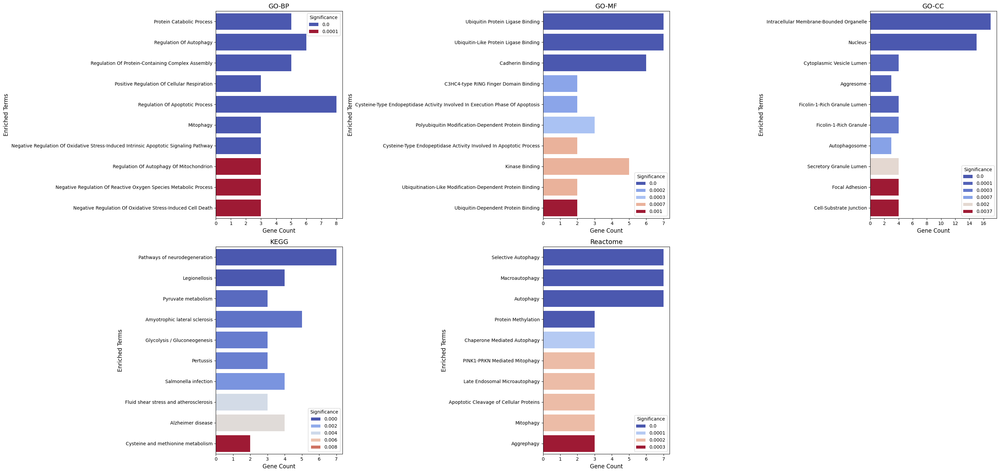

In [ ]:
#For proconsul
#Separating the results based on the database
proconsul_GO_BP = results_proconsul[results_proconsul['Gene_set']=='GO_Biological_Process_2023']
proconsul_GO_MF = results_proconsul[results_proconsul['Gene_set']=='GO_Molecular_Function_2023']
proconsul_GO_CC = results_proconsul[results_proconsul['Gene_set']=='GO_Cellular_Component_2023']
proconsul_KEGG = results_proconsul[results_proconsul['Gene_set']=='KEGG_2021_Human']
proconsul_Reactome = results_proconsul[results_proconsul['Gene_set']=='Reactome_Pathways_2024']

datasets_proconsul = [
    ('GO-BP', proconsul_GO_BP),
    ('GO-MF', proconsul_GO_MF),
    ('GO-CC', proconsul_GO_CC),
    ('KEGG', proconsul_KEGG),
    ('Reactome', proconsul_Reactome)
]

#Separated plots for each database for proconsul
fig, axes = plt.subplots(2, 3, figsize=(30, 15))

#Subplot
for ax, (db_i, db_res) in zip(axes.flat, datasets_proconsul):
    #Sorting and filtering results
    db_res_sorted = db_res.sort_values(by='Adjusted P-value', ascending=True)
    #Only significant values (<5%)
    db_res_sorted = db_res_sorted[db_res_sorted['Adjusted P-value'] < 0.05]

    #Approx. to 4 decimals for better visualization
    db_res_sorted['Adjusted P-value'] = db_res_sorted['Adjusted P-value'].round(4)

    #We take just the first 10 rows
    db_res_sorted = db_res_sorted.head(10)
    
    #Check if there are enough data for the graph
    if not db_res_sorted.empty:
        sns.barplot(x='Gene_count', y='Term', data=db_res_sorted, palette='coolwarm', hue='Adjusted P-value', ax=ax)
        ax.set_title(db_i, fontsize=14)
        ax.set_xlabel('Gene Count', fontsize=12)
        ax.set_ylabel('Enriched Terms', fontsize=12)
        ax.legend(title='Significance', loc='best', fontsize=10, title_fontsize=10)
        ax.tick_params(axis='y', labelsize=10)
    else:
        ax.set_title(db_i, fontsize=14)
        ax.text(0.5, 0.5, 'No significant results', ha='center', va='center', fontsize=12)
        ax.axis('off')

#Hiding the last subplot since it is not present
if len(datasets) < 6:
    axes[-1, -1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

----------------

## Additional Analysis

We check the intersections of the top100 predicted genes of all 3 algorithms.

In [119]:
# Diamond and DiaBLE
int_diamond_diable = set(diamond_df['Gene']) & set(df_diable['Gene'])
len(int_diamond_diable)


20

In [120]:
#The diffusion algorithms with different diffusion times
int_diff = set(df_diffusion['t = 0.002']) & set(df_diffusion['t = 0.005']) & set(df_diffusion['t = 0.01'])
len(int_diff)

100

In [121]:
#Diamond Diffusion
int_diamond_diff = set(diamond_df['Gene']) & set(df_diffusion['t = 0.002'])
print(int_diamond_diff)

#Diable Diffusion
int_diable_diff = set(df_diable['Gene']) & set(df_diffusion['t = 0.002'])
print(int_diable_diff)

#All 3 together
int_all_3 = set(diamond_df['Gene']) & set(df_diable['Gene']) & set(df_diffusion['t = 0.002'])
print(int_all_3)

{'GSTM3'}
{'GSTM3', 'CASP6', 'MDH1'}
{'GSTM3'}


Next we plot the putative disease interactomes from all 3 algorithms.

In [ ]:
###Putative disease module Diamond
nodis = list(disease_interactome.nodes) + list(diamond_df['Gene'])
putative_dis_module = PPI.subgraph(nodis).copy()

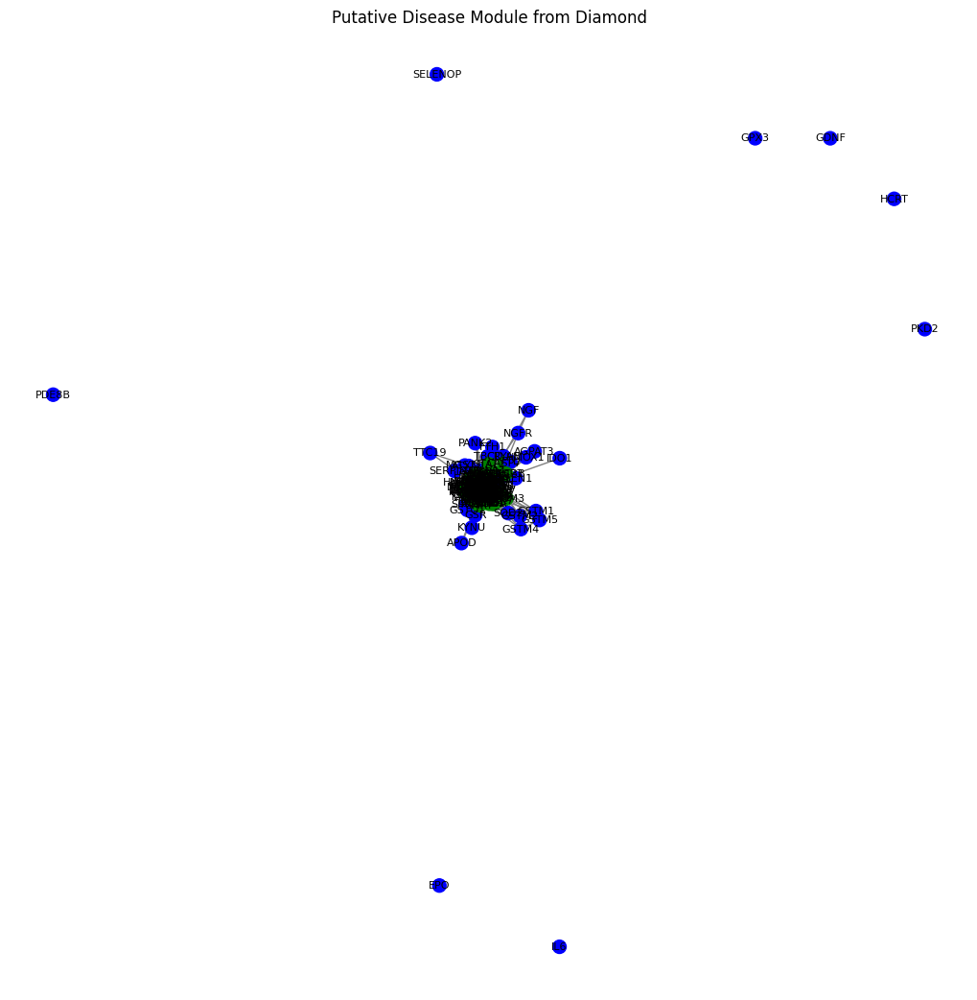

In [123]:
#Plot 
plt.figure(figsize=(10, 10))
color_map = []
for node in putative_dis_module:
    if node in list(disease_interactome.nodes):
        color_map.append('blue')
    else: 
        color_map.append('green')
nx.draw(putative_dis_module, node_color=color_map, edge_color='gray', with_labels=True, node_size=100, font_size=8)

# Create legend
blue_patch = mpatches.Patch(color='blue', label='Disease Genes')
green_patch = mpatches.Patch(color='green', label='Putative Disease Genes')
plt.legend(handles=[blue_patch, green_patch], loc='upper right')

# Add title
plt.title("Putative Disease Module with Top100 predicted Disease Genes from DIAMOnD")

# Show plot
plt.show()

In [125]:
###Putative disease module Diable
nodis_diable = list(disease_interactome.nodes) + list(df_diable['Gene'])
putative_dis_module = PPI.subgraph(nodis).copy()

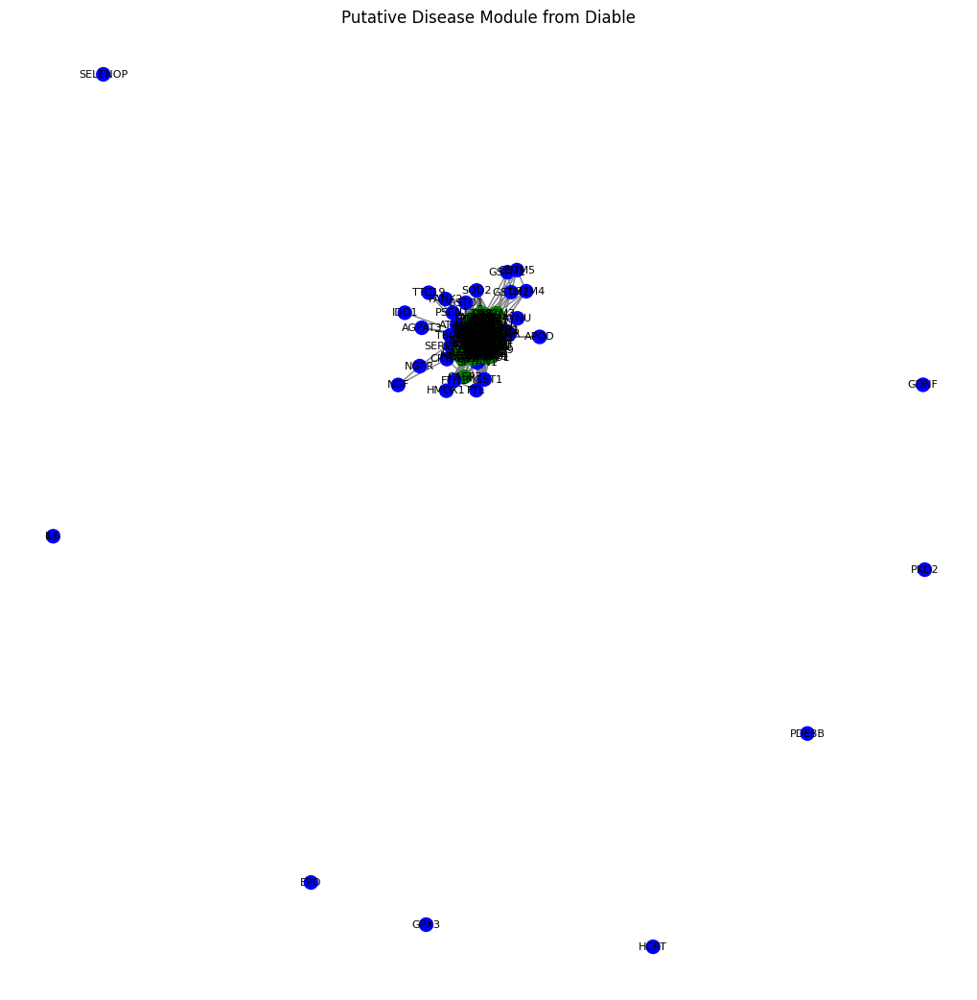

In [126]:
#Plot 
plt.figure(figsize=(10, 10))
color_map = []
for node in putative_dis_module:
    if node in list(disease_interactome.nodes):
        color_map.append('blue')
    else: 
        color_map.append('green')
nx.draw(putative_dis_module, node_color=color_map, edge_color='gray', with_labels=True, node_size=100, font_size=8)

# Create legend
blue_patch = mpatches.Patch(color='blue', label='Disease Genes')
green_patch = mpatches.Patch(color='green', label='Putative Disease Genes')
plt.legend(handles=[blue_patch, green_patch], loc='upper right')

plt.title("Putative Disease Module with Top100 predicted Disease Genes from DiaBLE")
plt.show()

In [127]:
###Putative disease module Heat Diffusion
nodis = list(disease_interactome.nodes) + list(df_diffusion['t = 0.002'])
putative_dis_module = PPI.subgraph(nodis).copy()

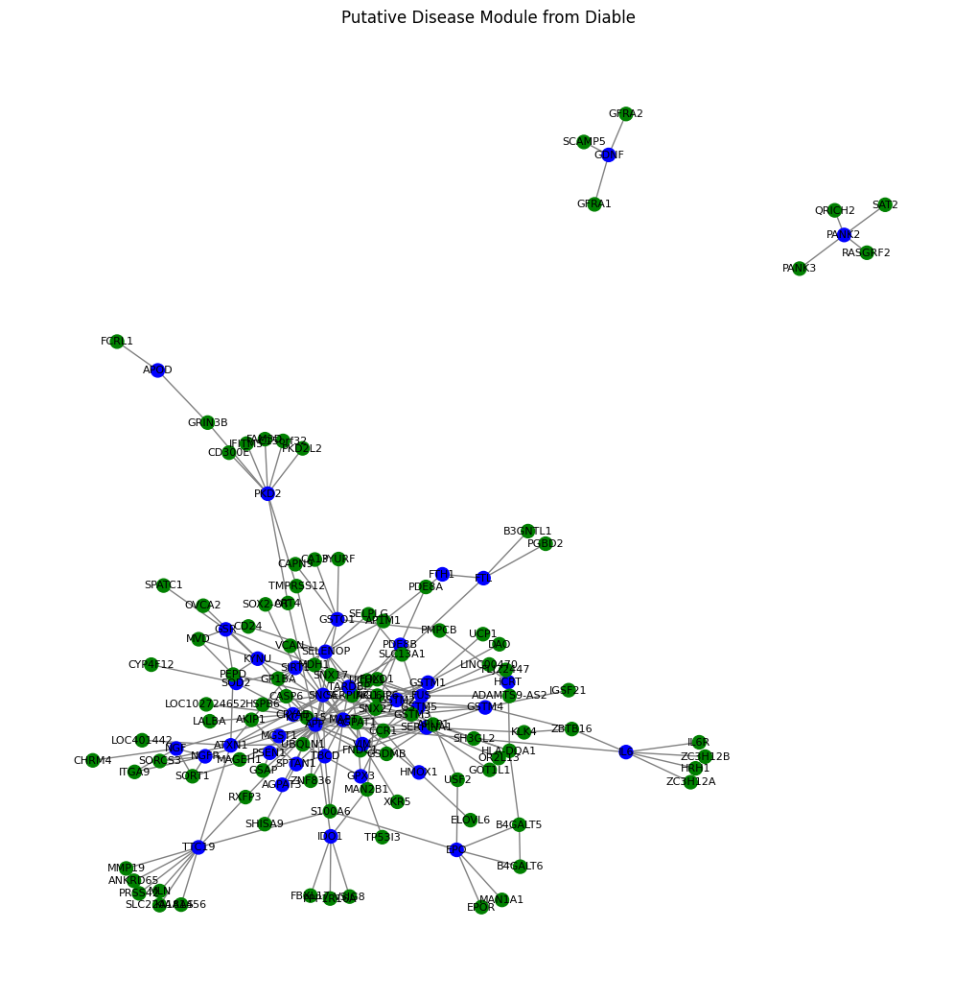

In [128]:
#Plot 
plt.figure(figsize=(10, 10))
color_map = []
for node in putative_dis_module:
    if node in list(disease_interactome.nodes):
        color_map.append('blue')
    else: 
        color_map.append('green')
nx.draw(putative_dis_module, node_color=color_map, edge_color='gray', with_labels=True, node_size=100, font_size=8)

# Create legend
blue_patch = mpatches.Patch(color='blue', label='Disease Genes')
green_patch = mpatches.Patch(color='green', label='Putative Disease Genes')
plt.legend(handles=[blue_patch, green_patch], loc='upper right')

plt.title("Putative Disease Module with Top100 predicted Disease Genes from Heat Diffusion")
plt.show()